# 1. Setup
Carregar as bibliotecas e configurar o script.

In [124]:
## 1.1 Carregar Bibliotecas

import os # os = Para configurar o diretório de trabalho
import numpy as np # Para realizar operações matemáticas
import pandas as pd # Para fazer a manipulação de dados
import matplotlib.pyplot as plt # Para fazer os gráficos
from shapely.geometry import MultiPolygon # Para juntar os polígonos
from shapely.geometry import Point
from shapely.ops import unary_union # Para juntar várias geometries em uma geometry só
import matplotlib.patches as mpatches # Para fazer a legendas
import janitor # Para fazer a limpeza dos dados
import geopandas as gpd # Para trabalhar com dados geoespaciais
import pyarrow # Para ler arquivos csv de forma eficiente
import pyogrio # Para ler arquivos shapefile de forma eficiente
from pyogrio import read_dataframe # Para ler arquivos shapefile de forma eficiente
import contextily as cx # Para adicionar o mapa base
import shapely # Para criar geometrias
import fiona # Para trabalhar com dados geoespaciais
from geopandas.tools import sjoin
from geopy.geocoders import Nominatim # Para geolocalizar enderecos usando o nome
from IPython.display import HTML # For displaying HTML content # Para criar a função scrollable_df
from IPython.display import display, HTML
from pyproj import Transformer

In [2]:
## 1.2 Configurar o diretório de trabalho
os.chdir("C:/Users/vinic/OneDrive/Mestrado/MonitoriaEnvLab/PS1") # Substitua o caminho pelo caminho do seu diretório de trabalho
print(os.getcwd()) 

C:\Users\vinic\OneDrive\Mestrado\MonitoriaEnvLab\PS1


In [3]:
## 1.3 Outras configurações
pd.options.display.float_format = '{:.2f}'.format # ver só 2 casas decimais
pd.set_option('display.max_columns', None) # mostrar todas as colunas

# Function to display a scrollable dataframe  
def display_scrollable_dataframe(df): 
    # Convert DataFrame to HTML
    html = df.to_html()

    # Display as a scrollable table
    display(HTML(
        '<div style="height:400px;overflow:auto">' +
        html +
        '</div>'
    ))

# 2. Carregar Logradouros e Distritos de São Paulo

In [4]:
## 2.1 Distritos de SP
distritos_sp_base = read_dataframe("Distritos_SaoPaulo/DEINFO_DISTRITO.shp") # Carrega o arquivo com os bairros de São Paulo. Lembrando que os arquivos shapefile são compostos por vários arquivos, então é importante que todos estejam na mesma pasta.
distritos_sp_base = distritos_sp_base.clean_names() # Limpa os nomes das colunas
distritos_sp_base.head() # Ver primeiras linhas

# Use pyogrio.read_dataframe() ao invés de geopandas.read_file() para ler arquivos shapefile de forma mais eficiente

,classid,featid,revisionnu,nome_dist,sigla_dist,cod_dist,cod_sub,data_criac,usuario_id,geometry
0,4.00,8583485.00,1.00,JOSE BONIFACIO,JBO,47,27,2007-03-19,0.00,"POLYGON ((352436.869 7394174.148, 352450.740 7..."
1,4.00,8583484.00,1.00,JD SAO LUIS,JDS,46,18,2007-03-19,0.00,"POLYGON ((320696.639 7383620.282, 320699.486 7..."
2,4.00,8583445.00,1.00,ARTUR ALVIM,AAL,5,21,2007-03-19,0.00,"POLYGON ((349461.276 7397764.525, 349461.935 7..."
3,4.00,8583479.00,1.00,JAGUARA,JAG,40,08,2007-03-19,0.00,"POLYGON ((320731.080 7400614.592, 320732.386 7..."
4,4.00,8583437.00,1.00,VILA PRUDENTE,VPR,93,29,2007-03-19,0.00,"POLYGON ((338651.039 7392203.484, 338654.034 7..."


In [5]:
distritos_sp_base.describe() # Ver estatísticas descritivas

,classid,featid,revisionnu,data_criac,usuario_id
count,96.00,96.00,96.00,96,96.00
mean,4.00,8583441.50,1.00,2007-03-19 00:00:00,0.00
min,4.00,8583394.00,1.00,2007-03-19 00:00:00,0.00
25%,4.00,8583417.75,1.00,2007-03-19 00:00:00,0.00
50%,4.00,8583441.50,1.00,2007-03-19 00:00:00,0.00
75%,4.00,8583465.25,1.00,2007-03-19 00:00:00,0.00
max,4.00,8583489.00,1.00,2007-03-19 00:00:00,0.00
std,0.00,27.86,0.00,NaN,0.00


São 96 distritos na cidade. Aqui temos os dicionários de dados para [`distritos_sp`](http://dados.prefeitura.sp.gov.br/pt_PT/dataset/distritos):</br>
| Arquivo         | Variável          | Nome da variável                    | Descrição da variável                                      | Fonte         | Tipo     | Tamanho | Sigilo |
|-----------------|-------------------|-------------------------------------|------------------------------------------------------------|---------------|----------|---------|--------|
| DEINFO_DISTRITO | CLASSID           | Classe ou categoria                 | Classe da feição - obrigatório                             | Sistema       | VALOR    |         | 0      |
| DEINFO_DISTRITO | FEATID            | Identificador                       | Número de identificação da feição para a classe - obrigatório | Sistema    | VALOR    |         | 0      |
| DEINFO_DISTRITO | REVISIONNU        | Número da revisão                   | Número da revisão, iniciando com zero (0) -- obrigatório   | Sistema       | VALOR    |         | 0      |
| DEINFO_DISTRITO | NOME_DIST         | Nome do Distrito                    | Nome do distrito                                           | SMDU/Deinfo   | TEXTO    | 50      | 0      |
| DEINFO_DISTRITO | SIGLA_DIST        | Sigla do Distrito                   | Sigla do distrito                                          | SMDU/Deinfo   | TEXTO    | 3       | 0      |
| DEINFO_DISTRITO | COD_DIST          | Código do Distrito                  | Código do distrito pelo IBGE                               | IBGE          | TEXTO    | 2       | 0      |
| DEINFO_DISTRITO | COD_SUB           | Código da Subprefeitura             | Código da subprefeitura (não preenchido)                   | SMDU/Deinfo   | TEXTO    | 2       | 0      |
| DEINFO_DISTRITO | DATA_CRIAC        | Data da criação                     | Data da inserção no banco de dados geográfico              | Sistema       | Data/hora|         | 0      |
| DEINFO_DISTRITO | USUARIO_ID_CRIACAO| Identificação usuários da criação   | Identificação do usuário que criou o registro              | Sistema       | VALOR    |         | 0      |


In [6]:
## 2.2 Subprefeituras SP
subprefeituras_sp_base = read_dataframe("Subprefeitura_SaoPaulo/SIRGAS_SHP_subprefeitura_polygon.shp") # Carrega o arquivo com as subprefeituras de São Paulo
subprefeituras_sp_base = subprefeituras_sp_base.clean_names() # Limpa os nomes das colunas
subprefeituras_sp_base.head() # Ver primeiras linhas

,sp_nome,sp_id,sp_codigo,sp_areakmt,sp_sigla,sp_areamt,geometry
0,PIRITUBA-JARAGUA,1.00,02,55.00,PJ,55435886.00,"POLYGON ((319192.002 7402406.415, 319192.339 7..."
1,FREGUESIA-BRASILANDIA,2.00,03,32.00,FO,32004787.00,"POLYGON ((327469.803 7399113.522, 327449.180 7..."
2,CASA VERDE-CACHOEIRINHA,3.00,04,27.00,CV,27205098.00,"POLYGON ((329079.913 7402343.759, 329082.494 7..."
3,VILA MARIA-VILA GUILHERME,6.00,07,27.00,MG,26899601.00,"POLYGON ((336675.044 7401136.914, 336698.453 7..."
4,PENHA,7.00,21,43.00,PE,43358124.00,"POLYGON ((341563.521 7399739.460, 341565.780 7..."


In [7]:
subprefeituras_sp_base.describe()

,sp_id,sp_areakmt,sp_areamt
count,32.00,32.00,32.00
mean,16.50,47.75,47730766.69
std,9.38,61.49,61469507.46
min,1.00,14.00,13631256.00
25%,8.75,25.00,25124441.50
50%,16.50,34.00,33892680.00
75%,24.25,47.50,47890317.25
max,32.00,361.00,360809940.00


São 32 subprefeituras na cidade.

In [8]:
## 2.3 Logradouros
logradouros_base = read_dataframe("Logradouros_SaoPaulo/SIRGAS_SHP_logradouronbl_line.shp") # Carrega o arquivo com os logradouros de São Paulo
logradouros_base = logradouros_base.clean_names() # Limpa os nomes das colunas
logradouros_base = logradouros_base.sort_values(by = "lg_codlog") # Ordena os logradouros por nome
logradouros_base.head()

,lg_ordem,lg_id,lg_seg_id,lg_or_geom,lg_codlog,lg_tipo,lg_titulo,lg_prep,lg_nome,lg_ini_par,lg_fim_par,lg_ini_imp,lg_fim_imp,geometry
177105,1.00,14451.00,222880,None,000027,R,None,None,COUTO DE CALVAO,0.00,62.00,1.00,63.00,"LINESTRING (319118.896 7381514.211, 319115.148..."
139601,1.00,14834.00,201562,None,000035,R,None,DO,PIROFONE,0.00,124.00,1.00,125.00,"LINESTRING (319961.496 7380000.035, 319968.071..."
159260,1.00,112164.00,120796,None,000043,R,None,DOS,ABACATEIROS,0.00,78.00,1.00,79.00,"LINESTRING (332635.000 7401656.952, 332706.227..."
126811,2.00,112164.00,120797,None,000043,R,None,DOS,ABACATEIROS,78.00,90.00,79.00,91.00,"LINESTRING (332706.227 7401687.223, 332718.799..."
96282,3.00,112164.00,120798,None,000043,R,None,DOS,ABACATEIROS,90.00,164.00,91.00,165.00,"LINESTRING (332718.799 7401692.566, 332716.563..."


In [9]:
logradouros_base.describe()

,lg_ordem,lg_id,lg_seg_id,lg_ini_par,lg_fim_par,lg_ini_imp,lg_fim_imp
count,203183.00,222532.00,222532.00,193609.00,193609.00,193739.00,193739.00
mean,14.51,58114.47,139833.31,387.92,471.49,396.71,478.65
std,2465.17,43598.21,84066.96,1054.32,1291.45,1120.32,1132.16
min,1.00,4121.00,1.00,0.00,0.00,0.00,0.00
25%,1.00,36712.75,69685.75,0.00,84.00,1.00,85.00
50%,3.00,48304.00,135965.50,106.00,194.00,107.00,195.00
75%,7.00,74646.25,205248.25,356.00,446.00,357.00,447.00
max,1111111.00,495797.00,308296.00,24436.00,320300.00,24437.00,25043.00


São 203K logradouros. Note que cada rua tem o mesmo nome e codlog, mas ruas grandes têm vários trechos nessa base. 'lg_ordem' representa esses trechos.</br>
Dicionários de dados para [`logradouros_sp`](https://www.google.com/url?sa=t&source=web&rct=j&opi=89978449&url=https://metadados.geosampa.prefeitura.sp.gov.br/geonetwork/intranet/api/records/620ed7e9-c4f7-4111-a268-346514a2b135/attachments/Dicion%25C3%25A1rio%2520logradouro.xls&ved=2ahUKEwi80Z6u0LWFAxUiO7kGHVyVBY4QFnoECBAQAQ&usg=AOvVaw3rPJx3U5DMUqkpw-NqXyNe):</br>
| Variável   | Descrição                                                   |
|------------|-------------------------------------------------------------|
| lg_codlog  | código do logradouro                                        |
| lg_tipo    | tipo do logradouro (rua, avenida, viela etc.)               |
| lg_titulo  | titulo do logradouro (são, santo, professor, coronel etc.)  |
| lg_prep    | preposição do nome do logradouro (de, das, dos etc.)        |
| lg_nome    | nome do logradouro                                          |
| lg_denomin | origem da denominação do Logradouro - CADLOG (C), MDSF (M) e SABESP (S) |
| lg_indica  | informa se o logradouro é oficial (O) ou não oficial (N)    |
| lg_ini_par | número inicial par                                          |
| lg_fim_par | número final impar                                          |
| lg_ini_imp | número inicial impar                                        |
| lg_fim_imp | número final impar                                          |
| lg_ordem   | número sequencial dos segmentos de um mesmo logradouro      |
| lg_id      | código identificador do logradouro                          |
| lg_seg_id  | código identificador do segmento de logradouro              |
| lg_fonte   | fonte da informação                                         |


In [10]:
## 2.4 IPTU
iptu_base = pd.read_csv('IPTU_2023.csv', sep=";", encoding="latin1", engine="pyarrow") # Carrega o arquivo com os dados do IPTU
iptu_base = iptu_base.clean_names()
iptu_base.head()

,numero_do_contribuinte,ano_do_exercicio,numero_da_nl,data_do_cadastramento,numero_do_condominio,codlog_do_imovel,nome_de_logradouro_do_imovel,numero_do_imovel,complemento_do_imovel,bairro_do_imovel,referencia_do_imovel,cep_do_imovel,quantidade_de_esquinas_frentes,fracao_ideal,area_do_terreno,area_construida,area_ocupada,valor_do_m2_do_terreno,valor_do_m2_de_construcao,ano_da_construcao_corrigido,quantidade_de_pavimentos,testada_para_calculo,tipo_de_uso_do_imovel,tipo_de_padrao_da_construcao,tipo_de_terreno,fator_de_obsolescencia,ano_de_inicio_da_vida_do_contribuinte,mes_de_inicio_da_vida_do_contribuinte,fase_do_contribuinte
0,0010030001-4,2023,1,01/01/23,00-0,03812-1,R S CAETANO,13.00,None,SANTA EFIGENIA,None,01104-001,1,1.00,136,135,108,3523.00,2600.00,1924,1,13.00,Loja,Comercial horizontal - padrão B,De esquina,0.20,1963,1,0
1,0010030002-2,2023,1,01/01/23,00-0,03812-1,R S CAETANO,19.00,None,SANTA EFIGENIA,None,01104-001,0,1.00,90,67,67,3523.00,2600.00,1944,1,6.00,Loja,Comercial horizontal - padrão B,Normal,0.20,1963,1,0
2,0010030003-0,2023,1,01/01/23,00-0,03812-1,R S CAETANO,27.00,None,SANTA EFIGENIA,None,01104-001,0,1.00,105,140,84,3523.00,2600.00,1965,2,7.85,Loja,Comercial horizontal - padrão B,Normal,0.24,1963,1,0
3,0010030004-9,2023,1,01/01/23,00-0,03812-1,R S CAETANO,33.00,None,None,None,01104-001,0,1.00,108,103,86,3523.00,2600.00,1944,1,6.05,Loja,Comercial horizontal - padrão B,Normal,0.20,1963,1,0
4,0010030005-7,2023,1,01/01/23,00-0,03812-1,R S CAETANO,39.00,None,None,None,01104-001,0,1.00,120,170,110,3523.00,2600.00,2004,2,6.70,Loja,Comercial horizontal - padrão B,Normal,0.83,1963,1,0


In [11]:
iptu_base.describe()

,ano_do_exercicio,numero_da_nl,numero_do_imovel,quantidade_de_esquinas_frentes,fracao_ideal,area_do_terreno,area_construida,area_ocupada,valor_do_m2_do_terreno,valor_do_m2_de_construcao,ano_da_construcao_corrigido,quantidade_de_pavimentos,testada_para_calculo,fator_de_obsolescencia,ano_de_inicio_da_vida_do_contribuinte,mes_de_inicio_da_vida_do_contribuinte,fase_do_contribuinte
count,3644459.00,3644459.00,3560194.00,3644459.00,3644459.00,3644459.00,3644459.00,3644459.00,3644459.00,3644459.00,3644459.00,3644459.00,3644459.00,3644459.00,3644459.00,3644459.00,3644459.00
mean,2023.00,1.00,587.88,0.57,0.46,4025.54,155.20,1328.11,3024.24,2161.81,1933.33,8.84,37.30,0.56,1988.53,1.79,0.00
std,0.00,0.00,1141.85,0.99,0.49,16845.73,1070.90,3501.17,3601.35,778.34,330.65,8.61,67.62,0.27,19.12,2.36,0.03
min,2023.00,1.00,0.00,0.00,0.00,1.00,0.00,0.00,77.00,0.00,0.00,0.00,0.00,0.00,1963.00,1.00,0.00
25%,2023.00,1.00,103.00,0.00,0.01,190.00,63.00,90.00,911.00,1635.00,1975.00,2.00,6.72,0.33,1971.00,1.00,0.00
50%,2023.00,1.00,264.00,0.00,0.04,755.00,100.00,350.00,1507.00,2115.00,1988.00,5.00,15.00,0.57,1986.00,1.00,0.00
75%,2023.00,1.00,623.00,1.00,1.00,2585.00,153.00,1282.00,3449.00,2976.00,2003.00,16.00,40.05,0.81,2006.00,1.00,0.00
max,2023.00,1.00,99541.00,9.00,1.00,4307493.00,950328.00,374240.00,31516.00,3998.00,2022.00,98.00,5274.00,0.99,2023.00,12.00,2.00


São 3.6M de imóveis. Como a base nos dá o CEP, endereço com número e codlog, podemos achar as coordenadas de cada um deles.</br>
Dicionários de dados para [`iptu_sp`](https://metadados.geosampa.prefeitura.sp.gov.br/geonetwork/srv/por/catalog.search#/metadata/b971efa1-aad5-42f3-ad28-18f1f4efe270):</br>
| Variáveis                           | Descrição das Variáveis                                                                                                                                                                                                                                                                                                           |
|-------------------------------------|-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------|
| NUMERO DO CONTRIBUINTE              | A cada imóvel urbano corresponderá um número de inscrição no Cadastro Imobiliário Fiscal, entendendo-se como imóvel: I – a área de terreno, construído ou não, definida em matrícula do competente Serviço de Registro de Imóveis ou em transcrições ainda vigente.                                                                |
| ANO DO EXERCICIO                    | Ano referente a coleta dos dados                                                                                                                                                                                                                                                                                                   |
| NUMERO DA NL                        | Número da Notificação de Lançamento                                                                                                                                                                                                                                                                                                |
| DATA DO CADASTRAMENTO               | Data de cadastamento do ano vigente                                                                                                                                                                                                                                                                                                |
| NUMERO DO CONDOMINIO                | Número do condomínio (se existente)                                                                                                                                                                                                                                                                                                |
| CODLOG DO IMOVEL                    | Código do Logradouro do Imóvel conforme Cadastro de Logradouro                                                                                                                                                                                                                                                                     |
| NOME DE LOGRADOURO DO IMOVEL        | Nome do Logradouro do Imóvel                                                                                                                                                                                                                                                                                                       |
| NUMERO DO IMOVEL                    | Número do Imóvel no Logradouro_Compõe o endereço do Imóvel                                                                                                                                                                                                                                                                         |
| COMPLEMENTO DO IMOVEL               | Complemento_Compõe o endereço do Imóvel                                                                                                                                                                                                                                                                                            |
| BAIRRO DO IMOVEL                    | Bairro_Compõe o endereço do Imóvel                                                                                                                                                                                                                                                                                                 |
| REFERENCIA DO IMOVEL                | Informações adicionais do imóvel                                                                                                                                                                                                                                                                                                   |
| CEP DO IMOVEL                       | Código de Endereçamento Postal                                                                                                                                                                                                                                                                                                     |
| QUANTIDADE DE ESQUINAS/FRENTES      | número de esquinas ou frentes do imóvel                                                                                                                                                                                                                                                                                            |
| FRACAO IDEAL                        | Parte indivisível e indeterminável das áreas comuns e de terreno, correspondente à unidade autônoma de cada condômino                                                                                                                                                                                                              |
| AREA DO TERRENO                     | Área do terreno (m²)                                                                                                                                                                                                                                                                                                              |
| AREA CONSTRUIDA                     | Área Construída do imóvel (m²)                                                                                                                                                                                                                                                                                                     |
| AREA OCUPADA                        | Área ocupada (m²)                                                                                                                                                                                                                                                                                                                 |
| VALOR DO M2 DO TERRENO              | Valor do metro quadrado do terreno em reais nominais                                                                                                                                                                                                                                                                               |
| VALOR DO M2 DE CONSTRUCAO           | Valor do metro quadrado da construção em reais nominais                                                                                                                                                                                                                                                                            |
| ANO DA CONSTRUCAO CORRIGIDO         | Ano da construção                                                                                                                                                                                                                                                                                                                  |
| QUANTIDADE DE PAVIMENTOS            | Número de pavimentos do imóvel                                                                                                                                                                                                                                                                                                     |
| TESTADA PARA CALCULO                | Testada                                                                                                                                                                                                                                                                                                                            |
| TIPO DE USO DO IMOVEL               | Tipo de uso do imóvel                                                                                                                                                                                                                                                                                                              |
| TIPO DE PADRAO DA CONSTRUCAO        | 29 tipos descritos na Tabela V – Tipos e padrões de construção_Integra a metodologia de apuração para a base de cálculo do IPTU                                                                                                                                                                                                    |
| TIPO DE TERRENO                     | Posição do terreno (normal, de esquina, interno, de duas ou mais frentes ou lote de fundos)                                                                                                                                                                                                                                        |
| FATOR DE OBSOLESCENCIA              | Coeficientes de depreciação do valor dos prédios, pela idade. Os valores constam da Tabela IV – Fatores de obsolescência_Integra a metodologia de apuração para a base de cálculo do IPTU                                                                                                                                         |
| ANO DE INICIO DA VIDA DO CONTRIBUINTE | Ano de inicio do contribuinte                                                                                                                                                                                                                                                                                                      |
| MES DE INICIO DA VIDA DO CONTRIBUINTE | Mês de inicio do contribuinte                                                                                                                                                                                                                                                                                                      |
| FASE DO CONTRIBUINTE                | sob consulta                                                                                                                                                                                                                                                                                                                       |


# 3. Calcular IPTU
Pela legislação da Cidade de São Paulo, o cálculo do IPTU depende do valor venal, área construída e tipo do imóvel. Na base de dados da prefeitura temos o valor do m2 de cada imóvel, a área contruída, o tipo e o logradouro de cada imóvel.</br>
</br>
Primeiro, vamos calcular quanto que cada imóvel pagou de IPTU em 2023. A legislação parece complicada, mas não é. Basta seguir a tabela no fim [desse](https://www.prefeitura.sp.gov.br/cidade/secretarias/fazenda/servicos/iptu/index.php?p=2456) manual.</br>
![IPTU_SP.png](CalculoIPTU.png)</br>


Para definir quanto cada imóvel pagou de IPTU em 2023, precisamos calcular o valor venal de cada imóvel. A fóruma para encontrar isso é dada por:</br>

$$ValorVenal_i = (FracaoIdeal_i \times AreaTerreno_i \times ValorM2Terreno_i + AreaConstrucao_i \times ValorM2Construcao_i) \times DescontoIdade_i$$

Em suma, o valor venal considera a fração das áreas comuns que pertence a cada unidade (essa fração é 1 se for uma casa de uma dono só, por exemplo) e a área construída de (ou seja, que tem um teto em cima) de cada imóvel. O valor por M2 é definido pela prefeitura em um cálculo complexo a partir das leis 6.989/1966, que sofreu diversas alterações, em especial, pela Lei 15.889/2013. Para nosso exercício, o valor exato do valor venal não é o foco. O mais importante aqui é entender as manipulações e construir os resultados.
Note que imóveis mais antigos têm um desconto maior. E imóveis residenciais têm uma alíquota diferente (a ser calculada adiante). A fonte para esse cáculo é [essa](https://conteudos.quintoandar.com.br/valor-venal/).</br>

Alguns lembretes:</br>
- Imóveis **residenciais** com valor venal inferior a 230 mil reais estão isentos de IPTU.
- Imóveis **não-residenciais** com valor venal inferior a 120 mil reais estão isentos de IPTU.

In [12]:
## 3.1 Ver uma observação qualquer 
iptu_base.iloc[1393131,]

numero_do_contribuinte                                        0673820065-1
ano_do_exercicio                                                      2023
numero_da_nl                                                             1
data_do_cadastramento                                             01/01/23
numero_do_condominio                                                  00-0
codlog_do_imovel                                                   07945-6
nome_de_logradouro_do_imovel                                  R  GERTRUDES
numero_do_imovel                                                    318.00
complemento_do_imovel                                                CS 12
bairro_do_imovel                                                      None
referencia_do_imovel                                         ENT 314 E 324
cep_do_imovel                                                    02208-010
quantidade_de_esquinas_frentes                                           0
fracao_ideal             

In [13]:
## 3.2 Subset da base de IPTU para colunas de interesse
iptu = iptu_base[['numero_do_contribuinte','codlog_do_imovel','numero_do_imovel','cep_do_imovel','tipo_de_uso_do_imovel', 'fator_de_obsolescencia','fracao_ideal','area_do_terreno', 'valor_do_m2_do_terreno','area_construida','valor_do_m2_de_construcao']]
iptu.head() # Mais limpo - Note que vários imóveis têm o mesmo CodLog. Vamos salvar os números da cada imóvel para poder plotar no mapa de forma mais acurada.

,numero_do_contribuinte,codlog_do_imovel,numero_do_imovel,cep_do_imovel,tipo_de_uso_do_imovel,fator_de_obsolescencia,fracao_ideal,area_do_terreno,valor_do_m2_do_terreno,area_construida,valor_do_m2_de_construcao
0,0010030001-4,03812-1,13.00,01104-001,Loja,0.20,1.00,136,3523.00,135,2600.00
1,0010030002-2,03812-1,19.00,01104-001,Loja,0.20,1.00,90,3523.00,67,2600.00
2,0010030003-0,03812-1,27.00,01104-001,Loja,0.24,1.00,105,3523.00,140,2600.00
3,0010030004-9,03812-1,33.00,01104-001,Loja,0.20,1.00,108,3523.00,103,2600.00
4,0010030005-7,03812-1,39.00,01104-001,Loja,0.83,1.00,120,3523.00,170,2600.00


In [14]:
## 3.3 Limpar coluna do codlog - tirar "-" para ficar igual a da base de dados de logradouros
iptu['codlog_do_imovel'] = iptu['codlog_do_imovel'].str.replace('-', '', regex=False) # Limpa o código do logradouro para poder juntar com a base de logradouros
iptu.head()

C:\Users\vinic\AppData\Local\Temp\ipykernel_4984\3934915198.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iptu['codlog_do_imovel'] = iptu['codlog_do_imovel'].str.replace('-', '', regex=False) # Limpa o código do logradouro para poder juntar com a base de logradouros


,numero_do_contribuinte,codlog_do_imovel,numero_do_imovel,cep_do_imovel,tipo_de_uso_do_imovel,fator_de_obsolescencia,fracao_ideal,area_do_terreno,valor_do_m2_do_terreno,area_construida,valor_do_m2_de_construcao
0,0010030001-4,038121,13.00,01104-001,Loja,0.20,1.00,136,3523.00,135,2600.00
1,0010030002-2,038121,19.00,01104-001,Loja,0.20,1.00,90,3523.00,67,2600.00
2,0010030003-0,038121,27.00,01104-001,Loja,0.24,1.00,105,3523.00,140,2600.00
3,0010030004-9,038121,33.00,01104-001,Loja,0.20,1.00,108,3523.00,103,2600.00
4,0010030005-7,038121,39.00,01104-001,Loja,0.83,1.00,120,3523.00,170,2600.00


In [15]:
## 3.4 Cálculo valor venal
iptu['valor_venal'] = ((iptu['fracao_ideal']*iptu['area_do_terreno'] * iptu['valor_do_m2_do_terreno']) + iptu['area_construida']*iptu['valor_do_m2_de_construcao']) * iptu['fator_de_obsolescencia']
iptu.head()

C:\Users\vinic\AppData\Local\Temp\ipykernel_4984\952565047.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iptu['valor_venal'] = ((iptu['fracao_ideal']*iptu['area_do_terreno'] * iptu['valor_do_m2_do_terreno']) + iptu['area_construida']*iptu['valor_do_m2_de_construcao']) * iptu['fator_de_obsolescencia']


,numero_do_contribuinte,codlog_do_imovel,numero_do_imovel,cep_do_imovel,tipo_de_uso_do_imovel,fator_de_obsolescencia,fracao_ideal,area_do_terreno,valor_do_m2_do_terreno,area_construida,valor_do_m2_de_construcao,valor_venal
0,0010030001-4,038121,13.00,01104-001,Loja,0.20,1.00,136,3523.00,135,2600.00,166025.60
1,0010030002-2,038121,19.00,01104-001,Loja,0.20,1.00,90,3523.00,67,2600.00,98254.00
2,0010030003-0,038121,27.00,01104-001,Loja,0.24,1.00,105,3523.00,140,2600.00,176139.60
3,0010030004-9,038121,33.00,01104-001,Loja,0.20,1.00,108,3523.00,103,2600.00,129656.80
4,0010030005-7,038121,39.00,01104-001,Loja,0.83,1.00,120,3523.00,170,2600.00,717750.80


In [16]:
## 3.5 Ver frequência dos tipos de imóveis
unique_tipos_de_uso = iptu['tipo_de_uso_do_imovel'].unique()
counts = iptu['tipo_de_uso_do_imovel'].value_counts()
counts # Ver os tipos de uso do imóvel e quantos imóveis tem cada tipo

tipo_de_uso_do_imovel
Apartamento em condomínio                                                                                                                             1488239
Residência                                                                                                                                            1089565
Residência coletiva, exclusive cortiço (mais de uma residência no lote)                                                                                206647
Garagem (unidade autônoma) em edifício em condomínio de uso exclusivamente residencial                                                                 202612
Escritório/consultório em condomínio (unidade autônoma)                                                                                                143135
Terreno                                                                                                                                                103300
Residência e outro uso (predom

In [17]:
## 3.5 Função que calcula o IPTU para cada imóvel

# Não é claro o que exatamente são "imóveis residenciais". Olhando a frequência dos tipos de imóveis, considerei esses o usos residenciais. De todo modo, captura maior parte deles
tipos_residenciais = ['Apartamento em condomínio',
                      'Residência coletiva, exclusive cortiço (mais de uma residência no lote)',
                      'Garagem (unidade autônoma) em edifício em condomínio de uso exclusivamente residencial',
                      'Flat residencial em condomínio',
                      'Prédio de apartamento, não em condomínio, de uso misto (apartamentos e escritórios e/ou consultórios), com ou sem loja (predominância residencial)',
                      'Prédio de apartamento, não em condomínio, de uso exclusivamente residencial',
                      'Residência',
                      'Residência e outro uso (predominância residencial)']

# A função abaixo apenas faz o que a tabela da base de cálculo do IPTU indica: calcula o IPTU com base no valor venal do imóvel
def calculate_iptu(row): # Função para calcular o IPTU de um imóvel em SP
    if row['tipo_de_uso_do_imovel'] in tipos_residenciais:
        if row['valor_venal'] < 230000: # Isento
            return 0
        elif 230000 <= row['valor_venal'] < 300000: # Faixa 2: 0,9% - 300
            return 0.009 * row['valor_venal'] - 300
        elif 300000 <= row['valor_venal'] < 600000: # Faixa 3: 1,1% - 900
            return 0.011 * row['valor_venal'] - 900
        elif 600000 <= row['valor_venal'] < 1200000: # Faixa 4: 1,3% - 3900
            return 0.013 * row['valor_venal'] - 3900
        elif row['valor_venal'] >= 1200000: # Faixa 5: 1,5% - 4500
            return 0.015 * row['valor_venal'] - 4500 # 
    else:
        if row['valor_venal'] < 120000: # Isento
            return 0
        elif 120000 <= row['valor_venal'] < 150000: # Faixa 1: 1,1%
            return 0.011 * row['valor_venal']
        elif 150000 <= row['valor_venal'] < 300000: # Faixa 2: 1,3% - 300
            return 0.013 * row['valor_venal'] - 300
        elif 300000 <= row['valor_venal'] < 600000: # Faixa 3: 1,5% - 900
            return 0.015 * row['valor_venal'] - 900
        elif 600000 <= row['valor_venal'] < 1200000: # Faixa 4: 1,7% - 3900
            return 0.017 * row['valor_venal'] - 3900
        elif row['valor_venal'] >= 1200000: # Faixa 5: 1,9% - 4500
            return 0.019 * row['valor_venal'] - 4500

In [18]:
## 3.6 Aplicar função acima em todos os 3.6M de imóveis - demora um pouco dado o tamanho da base
iptu['iptu'] = iptu.apply(calculate_iptu, axis = 1) # Aplica a função acima para calcular o IPTU de cada imóvel
iptu.head()

C:\Users\vinic\AppData\Local\Temp\ipykernel_4984\2304506466.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iptu['iptu'] = iptu.apply(calculate_iptu, axis = 1) # Aplica a função acima para calcular o IPTU de cada imóvel


,numero_do_contribuinte,codlog_do_imovel,numero_do_imovel,cep_do_imovel,tipo_de_uso_do_imovel,fator_de_obsolescencia,fracao_ideal,area_do_terreno,valor_do_m2_do_terreno,area_construida,valor_do_m2_de_construcao,valor_venal,iptu
0,0010030001-4,038121,13.00,01104-001,Loja,0.20,1.00,136,3523.00,135,2600.00,166025.60,1858.33
1,0010030002-2,038121,19.00,01104-001,Loja,0.20,1.00,90,3523.00,67,2600.00,98254.00,0.00
2,0010030003-0,038121,27.00,01104-001,Loja,0.24,1.00,105,3523.00,140,2600.00,176139.60,1989.81
3,0010030004-9,038121,33.00,01104-001,Loja,0.20,1.00,108,3523.00,103,2600.00,129656.80,1426.22
4,0010030005-7,038121,39.00,01104-001,Loja,0.83,1.00,120,3523.00,170,2600.00,717750.80,8301.76


In [19]:
iptu_final = iptu[['numero_do_contribuinte','codlog_do_imovel','numero_do_imovel','cep_do_imovel','tipo_de_uso_do_imovel','valor_venal','iptu']] # Seleciona as colunas de interesse
iptu_final = iptu_final.rename(columns = {'numero_do_contribuinte':'numero_contribuinte',
                                          'codlog_do_imovel':'lg_codlog',
                                          'numero_do_imovel':'numero_imovel',
                                          'cep_do_imovel':'cep',
                                          'tipo_de_uso_do_imovel':'tipo_uso'}) # Renomeia as colunas (para fazer o merge com os logradouros - 'codlog_do_imovel' vira 'lg_codlog', como na base de enderecos)
iptu_final = iptu_final.query('iptu > 0') # Filtra apenas os imóveis que pagam IPTU
iptu_final = iptu_final.sort_values(by = ['lg_codlog','numero_imovel']).reset_index(drop = True) # Ordena por nome do logradouro e número do imóvel e reseta o índice

In [20]:
iptu_final['numero_imovel'] = iptu_final['numero_imovel'].fillna(9998) # Se numero for NaN, transforma em 1 (como na base de enderecos)
iptu_final['numero_imovel'] = iptu_final['numero_imovel'].astype(int) # Transforma a coluna em inteiro (ao inves de float)

In [21]:
iptu_final.to_csv('iptu_final.csv', index = False) # Salva o dataset final em um arquivo csv

In [22]:
iptu_final

,numero_contribuinte,lg_codlog,numero_imovel,cep,tipo_uso,valor_venal,iptu
0,1671520149-7,000027,1,05859-040,Residência,437230.65,3909.54
1,1671520205-1,000027,5,05859-040,"Residência coletiva, exclusive cortiço (mais d...",5068143.27,71522.15
2,1671520150-0,000027,8,05859-040,Residência e outro uso (predominância residenc...,321623.34,2637.86
3,1671520148-9,000027,9,05859-040,Residência,300256.88,2402.83
4,0721780360-8,000043,15,02431-010,Residência,712779.48,5366.13
...,...,...,...,...,...,...,...
1471297,1593080279-2,977535,300,05528-200,Apartamento em condomínio,250698.61,1956.29
1471298,1593080280-6,977535,300,05528-200,Apartamento em condomínio,250698.61,1956.29
1471299,1593080281-4,977535,300,05528-200,Apartamento em condomínio,250698.61,1956.29
1471300,1593080282-2,977535,300,05528-200,Apartamento em condomínio,250698.61,1956.29


# 4. Limpar Base de Endereços

In [23]:
## 4.1 Logradouros
logradouros = logradouros_base.copy()
logradouros = logradouros[["lg_codlog",'lg_ordem',"lg_tipo", "lg_titulo", "lg_prep","lg_nome",'lg_ini_par','lg_fim_par','lg_ini_imp','lg_fim_imp','geometry']] # Seleciona as colunas de interesse
nrows = logradouros.shape[0] # Número de linhas
for i in range(nrows):
    if logradouros.loc[i,'lg_ini_par'] >= 0 and logradouros.loc[i,'lg_ini_imp'] >= 0:
        logradouros.loc[i,'numero_min'] = min(logradouros.loc[i,'lg_ini_par'],logradouros.loc[i,'lg_ini_imp']) + 1
        logradouros.loc[i,'numero_max'] = max(logradouros.loc[i,'lg_fim_par'],logradouros.loc[i,'lg_fim_imp'])
    elif logradouros.loc[i,'lg_ini_par'] >= 0 and pd.isna(logradouros.loc[i,'lg_ini_imp']):
        logradouros.loc[i,'numero_min'] = logradouros.loc[i,'lg_ini_par']
        logradouros.loc[i,'numero_max'] = logradouros.loc[i,'lg_fim_par']
    elif logradouros.loc[i,'lg_ini_imp'] >= 0 and pd.isna(logradouros.loc[i,'lg_ini_par']):
        logradouros.loc[i,'numero_min'] = logradouros.loc[i,'lg_ini_imp']
        logradouros.loc[i,'numero_max'] = logradouros.loc[i,'lg_fim_imp']
logradouros['numero_min'] = logradouros['numero_min'].fillna(9997) # Tranforma NaNs em 9998
logradouros['numero_min'] = logradouros['numero_min'].astype(int)
logradouros['numero_max'] = logradouros['numero_max'].fillna(9998) # Tranforma NaNs em 9998
logradouros['numero_max'] = logradouros['numero_max'].astype(int)
logradouros = logradouros.sort_values(by = ["lg_codlog", "lg_ordem"]) # Ordena os logradouros por nome e ordem (posicao do trecho na rua)
logradouros = logradouros.reset_index(drop = True) # Reseta o índice
        

In [24]:
logradouros

,lg_codlog,lg_ordem,lg_tipo,lg_titulo,lg_prep,lg_nome,lg_ini_par,lg_fim_par,lg_ini_imp,lg_fim_imp,geometry,numero_min,numero_max
0,000027,1.00,R,None,None,COUTO DE CALVAO,0.00,62.00,1.00,63.00,"LINESTRING (319118.896 7381514.211, 319115.148...",1,63
1,000035,1.00,R,None,DO,PIROFONE,0.00,124.00,1.00,125.00,"LINESTRING (319961.496 7380000.035, 319968.071...",1,125
2,000043,1.00,R,None,DOS,ABACATEIROS,0.00,78.00,1.00,79.00,"LINESTRING (332635.000 7401656.952, 332706.227...",1,79
3,000043,2.00,R,None,DOS,ABACATEIROS,78.00,90.00,79.00,91.00,"LINESTRING (332706.227 7401687.223, 332718.799...",79,91
4,000043,3.00,R,None,DOS,ABACATEIROS,90.00,164.00,91.00,165.00,"LINESTRING (332718.799 7401692.566, 332716.563...",91,165
...,...,...,...,...,...,...,...,...,...,...,...,...,...
222527,None,NaN,PC,MADRE,None,MARIA JOSEFINA VILLAC,NaN,NaN,NaN,NaN,"LINESTRING (354170.419 7402706.058, 354180.943...",9997,9998
222528,None,NaN,PC,BR,DE,SAICA,NaN,NaN,NaN,NaN,"LINESTRING (343020.980 7399135.801, 343020.629...",9997,9998
222529,None,NaN,None,None,None,None,NaN,NaN,NaN,NaN,"LINESTRING (332936.533 7381613.550, 332925.395...",9997,9998
222530,None,NaN,ESC,None,None,ESCADARIA,NaN,NaN,NaN,NaN,"LINESTRING (323731.507 7408101.294, 323733.526...",9997,9998


In [25]:
ruas_na = logradouros.query('numero_min == 9997') # Ruas que numero min == 9997 (que definimos para NaNs)
display_scrollable_dataframe(ruas_na) # São ruas que simplesmente não tem número

,lg_codlog,lg_ordem,lg_tipo,lg_titulo,lg_prep,lg_nome,lg_ini_par,lg_fim_par,lg_ini_imp,lg_fim_imp,geometry,numero_min,numero_max
233,000612,NaN,AV,DR,None,ABRAAO RIBEIRO,NaN,NaN,NaN,NaN,"LINESTRING (330877.483 7397993.346, 330870.544 7398012.159)",9997,9998
234,000612,NaN,AV,DR,None,ABRAAO RIBEIRO,NaN,NaN,NaN,NaN,"LINESTRING (330985.791 7398099.600, 330981.486 7398117.299)",9997,9998
306,000663,NaN,AV,PROF,None,ABRAAO DE MORAIS,NaN,NaN,NaN,NaN,"LINESTRING (333901.158 7386662.973, 333908.468 7386657.813, 333918.848 7386654.264)",9997,9998
307,000663,NaN,AV,PROF,None,ABRAAO DE MORAIS,NaN,NaN,NaN,NaN,"LINESTRING (333797.246 7386135.506, 333794.366 7386049.054, 333792.387 7386030.593, 333788.428 7386001.582, 333786.734 7385991.425)",9997,9998
308,000663,NaN,AV,PROF,None,ABRAAO DE MORAIS,NaN,NaN,NaN,NaN,"LINESTRING (334039.177 7388510.011, 334043.033 7388493.671, 334050.009 7388488.164, 334058.638 7388487.980, 334063.779 7388490.734, 334071.673 7388498.261)",9997,9998
309,000663,NaN,AV,PROF,None,ABRAAO DE MORAIS,NaN,NaN,NaN,NaN,"LINESTRING (333792.701 7386176.203, 333809.438 7386178.146)",9997,9998
310,000663,NaN,AV,PROF,None,ABRAAO DE MORAIS,NaN,NaN,NaN,NaN,"LINESTRING (333918.848 7386654.264, 333919.423 7386654.068, 333928.938 7386655.796, 333932.448 7386660.288)",9997,9998
311,000663,NaN,AV,PROF,None,ABRAAO DE MORAIS,NaN,NaN,NaN,NaN,"LINESTRING (333947.720 7386774.021, 333947.721 7386760.988, 333946.976 7386726.586)",9997,9998
312,000663,NaN,AV,PROF,None,ABRAAO DE MORAIS,NaN,NaN,NaN,NaN,"LINESTRING (333924.638 7386911.908, 333934.396 7386913.301, 333940.715 7386911.035)",9997,9998
313,000663,NaN,AV,PROF,None,ABRAAO DE MORAIS,NaN,NaN,NaN,NaN,"LINESTRING (333908.183 7386897.190, 333916.315 7386906.436, 333924.271 7386911.856, 333924.638 7386911.908)",9997,9998


In [26]:
logradouros['point_coord'] = logradouros['geometry'].centroid # Pega o centro de cada linha - depois usaremos isso para identificar qual bairro pertence cada trecho de rua
logradouros.head()

,lg_codlog,lg_ordem,lg_tipo,lg_titulo,lg_prep,lg_nome,lg_ini_par,lg_fim_par,lg_ini_imp,lg_fim_imp,geometry,numero_min,numero_max,point_coord
0,000027,1.00,R,None,None,COUTO DE CALVAO,0.00,62.00,1.00,63.00,"LINESTRING (319118.896 7381514.211, 319115.148...",1,63,POINT (319111.150 7381482.663)
1,000035,1.00,R,None,DO,PIROFONE,0.00,124.00,1.00,125.00,"LINESTRING (319961.496 7380000.035, 319968.071...",1,125,POINT (320000.479 7379949.601)
2,000043,1.00,R,None,DOS,ABACATEIROS,0.00,78.00,1.00,79.00,"LINESTRING (332635.000 7401656.952, 332706.227...",1,79,POINT (332670.613 7401672.087)
3,000043,2.00,R,None,DOS,ABACATEIROS,78.00,90.00,79.00,91.00,"LINESTRING (332706.227 7401687.223, 332718.799...",79,91,POINT (332712.513 7401689.894)
4,000043,3.00,R,None,DOS,ABACATEIROS,90.00,164.00,91.00,165.00,"LINESTRING (332718.799 7401692.566, 332716.563...",91,165,POINT (332733.885 7401724.983)


In [27]:
## 3.2 Distritos
distritos = distritos_sp_base.copy()  
distritos


,classid,featid,revisionnu,nome_dist,sigla_dist,cod_dist,cod_sub,data_criac,usuario_id,geometry
0,4.00,8583485.00,1.00,JOSE BONIFACIO,JBO,47,27,2007-03-19,0.00,"POLYGON ((352436.869 7394174.148, 352450.740 7..."
1,4.00,8583484.00,1.00,JD SAO LUIS,JDS,46,18,2007-03-19,0.00,"POLYGON ((320696.639 7383620.282, 320699.486 7..."
2,4.00,8583445.00,1.00,ARTUR ALVIM,AAL,5,21,2007-03-19,0.00,"POLYGON ((349461.276 7397764.525, 349461.935 7..."
3,4.00,8583479.00,1.00,JAGUARA,JAG,40,08,2007-03-19,0.00,"POLYGON ((320731.080 7400614.592, 320732.386 7..."
4,4.00,8583437.00,1.00,VILA PRUDENTE,VPR,93,29,2007-03-19,0.00,"POLYGON ((338651.039 7392203.484, 338654.034 7..."
...,...,...,...,...,...,...,...,...,...,...
91,4.00,8583433.00,1.00,VILA MARIA,VMR,89,07,2007-03-19,0.00,"POLYGON ((338228.823 7397145.610, 338216.895 7..."
92,4.00,8583434.00,1.00,VILA MARIANA,VMN,90,12,2007-03-19,0.00,"POLYGON ((331606.384 7389277.797, 331607.340 7..."
93,4.00,8583435.00,1.00,VILA MATILDE,VMT,91,21,2007-03-19,0.00,"POLYGON ((341994.993 7396441.620, 341979.394 7..."
94,4.00,8583412.00,1.00,SANTA CECILIA,SCE,69,09,2007-03-19,0.00,"POLYGON ((330220.609 7396091.962, 330226.819 7..."


In [28]:
distritos = distritos.sort_values(by = "cod_dist").reset_index(drop = True) # Orden por codigo do distrito e reseta o índice
distritos = distritos[['cod_dist','nome_dist','cod_sub','geometry']]
distritos_geometry = distritos[['cod_dist','geometry']] # Dataset com as geometries dos distritos
distritos = distritos.drop('geometry', axis=1) # Excluir coluna das geometries
distritos

,cod_dist,nome_dist,cod_sub
0,01,AGUA RASA,25
1,10,BRAS,25
2,11,BRASILANDIA,03
3,12,BUTANTA,10
4,13,CACHOEIRINHA,04
...,...,...,...
91,92,VILA MEDEIROS,07
92,93,VILA PRUDENTE,29
93,94,VILA SONIA,10
94,95,SAO DOMINGOS,02


In [29]:
distritos_geometry

,cod_dist,geometry
0,01,"POLYGON ((338651.039 7392203.484, 338649.104 7..."
1,10,"POLYGON ((335693.406 7394201.979, 335634.975 7..."
2,11,"POLYGON ((324940.174 7404303.683, 324938.671 7..."
3,12,"POLYGON ((320769.323 7390512.440, 320766.909 7..."
4,13,"POLYGON ((330995.734 7402227.712, 330990.010 7..."
...,...,...
91,92,"POLYGON ((338328.107 7402709.948, 338335.642 7..."
92,93,"POLYGON ((338651.039 7392203.484, 338654.034 7..."
93,94,"POLYGON ((320402.478 7389551.141, 320413.955 7..."
94,95,"POLYGON ((320981.891 7403049.322, 320982.591 7..."


In [30]:
## Subprefeituras
subprefeituras = subprefeituras_sp_base.copy()
subprefeituras.head()

,sp_nome,sp_id,sp_codigo,sp_areakmt,sp_sigla,sp_areamt,geometry
0,PIRITUBA-JARAGUA,1.00,02,55.00,PJ,55435886.00,"POLYGON ((319192.002 7402406.415, 319192.339 7..."
1,FREGUESIA-BRASILANDIA,2.00,03,32.00,FO,32004787.00,"POLYGON ((327469.803 7399113.522, 327449.180 7..."
2,CASA VERDE-CACHOEIRINHA,3.00,04,27.00,CV,27205098.00,"POLYGON ((329079.913 7402343.759, 329082.494 7..."
3,VILA MARIA-VILA GUILHERME,6.00,07,27.00,MG,26899601.00,"POLYGON ((336675.044 7401136.914, 336698.453 7..."
4,PENHA,7.00,21,43.00,PE,43358124.00,"POLYGON ((341563.521 7399739.460, 341565.780 7..."


In [31]:
subprefeituras = subprefeituras[['sp_codigo','sp_nome','geometry']] # sp = subprefeitura (não é São Paulo)
subprefeituras_geometry = subprefeituras[['sp_codigo','geometry']] # Dataset com as geometries das subprefeituras
subprefeituras = subprefeituras.drop('geometry', axis=1) # Excluir coluna das geometries
subprefeituras = subprefeituras.rename(columns={'sp_codigo':'cod_sub', 'sp_nome':'nome_sub'}) # Renomeia a coluna sp_codigo para cod_sub (para fazer o merge com os distritos)
subprefeituras.head()

,cod_sub,nome_sub
0,02,PIRITUBA-JARAGUA
1,03,FREGUESIA-BRASILANDIA
2,04,CASA VERDE-CACHOEIRINHA
3,07,VILA MARIA-VILA GUILHERME
4,21,PENHA


In [32]:
## 4.4 Unir base de distritos e subprefeituras
distritos_subprefeituras = distritos.merge(subprefeituras, on = 'cod_sub', how = 'outer')
distritos_subprefeituras = distritos_subprefeituras.sort_values(by = ['cod_sub','cod_dist']).reset_index(drop = True)
distritos_subprefeituras

,cod_dist,nome_dist,cod_sub,nome_sub
0,3,ANHANGUERA,01,PERUS
1,61,PERUS,01,PERUS
2,42,JARAGUA,02,PIRITUBA-JARAGUA
3,63,PIRITUBA,02,PIRITUBA-JARAGUA
4,95,SAO DOMINGOS,02,PIRITUBA-JARAGUA
...,...,...,...,...
91,33,IGUATEMI,30,SAO MATEUS
92,73,SAO MATEUS,30,SAO MATEUS
93,75,SAO RAFAEL,30,SAO MATEUS
94,25,CID TIRADENTES,31,CIDADE TIRADENTES


In [33]:
## 4.5 Unir base de distritos e subprefeituras à de logradouros
distritos_geometry = gpd.GeoDataFrame(distritos_geometry, geometry = 'geometry') # Assegurar que é um GeoDataFrame
distritos_geometry.crs = 'EPSG:31983' # Definir o sistema de coordenadas - apenas usando a CRS da Prefeitura de SP

enderecos = distritos_subprefeituras.merge(distritos_geometry, on = 'cod_dist', how = 'outer') # adicionar geometry dos distritos ao dataset
enderecos

,cod_dist,nome_dist,cod_sub,nome_sub,geometry
0,3,ANHANGUERA,01,PERUS,"POLYGON ((317544.550 7410560.045, 317548.660 7..."
1,61,PERUS,01,PERUS,"POLYGON ((325511.530 7409376.964, 325510.015 7..."
2,42,JARAGUA,02,PIRITUBA-JARAGUA,"POLYGON ((320069.659 7407622.486, 320069.992 7..."
3,63,PIRITUBA,02,PIRITUBA-JARAGUA,"POLYGON ((320981.891 7403049.322, 320979.930 7..."
4,95,SAO DOMINGOS,02,PIRITUBA-JARAGUA,"POLYGON ((320981.891 7403049.322, 320982.591 7..."
...,...,...,...,...,...
91,33,IGUATEMI,30,SAO MATEUS,"POLYGON ((357484.136 7387658.048, 357473.872 7..."
92,73,SAO MATEUS,30,SAO MATEUS,"POLYGON ((348002.169 7391379.700, 347994.017 7..."
93,75,SAO RAFAEL,30,SAO MATEUS,"POLYGON ((348943.829 7386656.753, 348946.667 7..."
94,25,CID TIRADENTES,31,CIDADE TIRADENTES,"POLYGON ((355350.639 7390194.343, 355354.193 7..."


In [34]:
## 4.6 Usar as point_coord de cada logradouro para identificar o seu distrito (e subprefeitura)
logradouros = gpd.GeoDataFrame(logradouros, geometry = 'point_coord') # Assegurar que é um GeoDataFrame	
logradouros.crs = 'EPSG:31983' # Definir o sistema de coordenadas - apenas usando a CRS da Prefeitura de SP

enderecos = gpd.GeoDataFrame(enderecos, geometry = 'geometry') # Assegurar que é um GeoDataFrame
enderecos.crs = 'EPSG:31983' # Definir o sistema de coordenadas - apenas usando a CRS da Prefeitura de SP

In [35]:
enderecos = gpd.sjoin(logradouros, enderecos, how = 'left', op = 'within') # Identificar o distrito de cada trecho de rua
enderecos # dataset com logradouros da cidade e os distritos (e subprefeituras) de cada um - usaremos para ver onde cada imóvel está

C:\Users\vinic\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\IPython\core\interactiveshell.py:3493: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):


,lg_codlog,lg_ordem,lg_tipo,lg_titulo,lg_prep,lg_nome,lg_ini_par,lg_fim_par,lg_ini_imp,lg_fim_imp,geometry,numero_min,numero_max,point_coord,index_right,cod_dist,nome_dist,cod_sub,nome_sub
0,000027,1.00,R,None,None,COUTO DE CALVAO,0.00,62.00,1.00,63.00,"LINESTRING (319118.896 7381514.211, 319115.148...",1,63,POINT (319111.150 7381482.663),54.00,19,CAPAO REDONDO,17,CAMPO LIMPO
1,000035,1.00,R,None,DO,PIROFONE,0.00,124.00,1.00,125.00,"LINESTRING (319961.496 7380000.035, 319968.071...",1,125,POINT (320000.479 7379949.601),56.00,43,JD ANGELA,18,M BOI MIRIM
2,000043,1.00,R,None,DOS,ABACATEIROS,0.00,78.00,1.00,79.00,"LINESTRING (332635.000 7401656.952, 332706.227...",1,79,POINT (332670.613 7401672.087),11.00,70,SANTANA,05,SANTANA-TUCURUVI
3,000043,2.00,R,None,DOS,ABACATEIROS,78.00,90.00,79.00,91.00,"LINESTRING (332706.227 7401687.223, 332718.799...",79,91,POINT (332712.513 7401689.894),11.00,70,SANTANA,05,SANTANA-TUCURUVI
4,000043,3.00,R,None,DOS,ABACATEIROS,90.00,164.00,91.00,165.00,"LINESTRING (332718.799 7401692.566, 332716.563...",91,165,POINT (332733.885 7401724.983),11.00,70,SANTANA,05,SANTANA-TUCURUVI
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
222527,None,NaN,PC,MADRE,None,MARIA JOSEFINA VILLAC,NaN,NaN,NaN,NaN,"LINESTRING (354170.419 7402706.058, 354180.943...",9997,9998,POINT (354175.681 7402709.230),69.00,44,JD HELENA,23,SAO MIGUEL
222528,None,NaN,PC,BR,DE,SAICA,NaN,NaN,NaN,NaN,"LINESTRING (343020.980 7399135.801, 343020.629...",9997,9998,POINT (343062.554 7399182.837),63.00,18,CANGAIBA,21,PENHA
222529,None,NaN,None,None,None,None,NaN,NaN,NaN,NaN,"LINESTRING (332936.533 7381613.550, 332925.395...",9997,9998,POINT (332930.964 7381625.097),50.00,38,JABAQUARA,15,JABAQUARA
222530,None,NaN,ESC,None,None,ESCADARIA,NaN,NaN,NaN,NaN,"LINESTRING (323731.507 7408101.294, 323733.526...",9997,9998,POINT (323747.957 7408079.304),2.00,42,JARAGUA,02,PIRITUBA-JARAGUA


In [36]:
logradouros

,lg_codlog,lg_ordem,lg_tipo,lg_titulo,lg_prep,lg_nome,lg_ini_par,lg_fim_par,lg_ini_imp,lg_fim_imp,geometry,numero_min,numero_max,point_coord
0,000027,1.00,R,None,None,COUTO DE CALVAO,0.00,62.00,1.00,63.00,"LINESTRING (319118.896 7381514.211, 319115.148...",1,63,POINT (319111.150 7381482.663)
1,000035,1.00,R,None,DO,PIROFONE,0.00,124.00,1.00,125.00,"LINESTRING (319961.496 7380000.035, 319968.071...",1,125,POINT (320000.479 7379949.601)
2,000043,1.00,R,None,DOS,ABACATEIROS,0.00,78.00,1.00,79.00,"LINESTRING (332635.000 7401656.952, 332706.227...",1,79,POINT (332670.613 7401672.087)
3,000043,2.00,R,None,DOS,ABACATEIROS,78.00,90.00,79.00,91.00,"LINESTRING (332706.227 7401687.223, 332718.799...",79,91,POINT (332712.513 7401689.894)
4,000043,3.00,R,None,DOS,ABACATEIROS,90.00,164.00,91.00,165.00,"LINESTRING (332718.799 7401692.566, 332716.563...",91,165,POINT (332733.885 7401724.983)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
222527,None,NaN,PC,MADRE,None,MARIA JOSEFINA VILLAC,NaN,NaN,NaN,NaN,"LINESTRING (354170.419 7402706.058, 354180.943...",9997,9998,POINT (354175.681 7402709.230)
222528,None,NaN,PC,BR,DE,SAICA,NaN,NaN,NaN,NaN,"LINESTRING (343020.980 7399135.801, 343020.629...",9997,9998,POINT (343062.554 7399182.837)
222529,None,NaN,None,None,None,None,NaN,NaN,NaN,NaN,"LINESTRING (332936.533 7381613.550, 332925.395...",9997,9998,POINT (332930.964 7381625.097)
222530,None,NaN,ESC,None,None,ESCADARIA,NaN,NaN,NaN,NaN,"LINESTRING (323731.507 7408101.294, 323733.526...",9997,9998,POINT (323747.957 7408079.304)


In [37]:
logradouros.query('lg_codlog == "068977"') # Verificar se está funcionando

,lg_codlog,lg_ordem,lg_tipo,lg_titulo,lg_prep,lg_nome,lg_ini_par,lg_fim_par,lg_ini_imp,lg_fim_imp,geometry,numero_min,numero_max,point_coord
33847,068977,1.00,AV,BRIG,None,FARIA LIMA,0.00,44.00,NaN,NaN,"LINESTRING (326810.572 7393529.730, 326827.125...",0,44,POINT (326826.642 7393513.475)
33848,068977,2.00,AV,BRIG,None,FARIA LIMA,44.00,232.00,NaN,NaN,"LINESTRING (326842.122 7393496.657, 326852.486...",44,232,POINT (326902.134 7393426.685)
33849,068977,3.00,AV,BRIG,None,FARIA LIMA,NaN,NaN,53.00,99.00,"LINESTRING (326856.537 7393512.403, 326891.042...",53,99,POINT (326873.790 7393492.151)
33850,068977,4.00,AV,BRIG,None,FARIA LIMA,NaN,NaN,99.00,217.00,"LINESTRING (326891.042 7393471.899, 326966.854...",99,217,POINT (326928.948 7393427.470)
33851,068977,5.00,AV,BRIG,None,FARIA LIMA,NaN,NaN,217.00,325.00,"LINESTRING (326966.854 7393383.040, 327027.333...",217,325,POINT (327002.443 7393341.386)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34006,068977,NaN,AV,BRIG,None,FARIA LIMA,NaN,NaN,NaN,NaN,"LINESTRING (328613.690 7389399.401, 328615.879...",9997,9998,POINT (328617.676 7389373.039)
34007,068977,NaN,AV,BRIG,None,FARIA LIMA,NaN,NaN,NaN,NaN,"LINESTRING (327530.535 7392128.478, 327528.022...",9997,9998,POINT (327520.656 7392118.623)
34008,068977,NaN,AV,BRIG,None,FARIA LIMA,NaN,NaN,NaN,NaN,"LINESTRING (326966.854 7393383.040, 326962.339...",9997,9998,POINT (326964.596 7393369.958)
34009,068977,NaN,AV,BRIG,None,FARIA LIMA,NaN,NaN,NaN,NaN,"LINESTRING (327545.991 7392077.970, 327560.129...",9997,9998,POINT (327553.060 7392078.656)


In [38]:
enderecos = enderecos[['lg_codlog','lg_ordem','lg_tipo','lg_titulo','lg_prep','lg_nome','numero_min','numero_max','cod_dist','nome_dist','cod_sub','nome_sub','point_coord']] # Seleciona as colunas de interesse
enderecos = enderecos.sort_values(by = ['lg_codlog','lg_ordem']).reset_index(drop = True) # Ordena por nome do logradouro e ordem (posicao do trecho na rua) e reseta o índice
enderecos

,lg_codlog,lg_ordem,lg_tipo,lg_titulo,lg_prep,lg_nome,numero_min,numero_max,cod_dist,nome_dist,cod_sub,nome_sub,point_coord
0,000027,1.00,R,None,None,COUTO DE CALVAO,1,63,19,CAPAO REDONDO,17,CAMPO LIMPO,POINT (319111.150 7381482.663)
1,000035,1.00,R,None,DO,PIROFONE,1,125,43,JD ANGELA,18,M BOI MIRIM,POINT (320000.479 7379949.601)
2,000043,1.00,R,None,DOS,ABACATEIROS,1,79,70,SANTANA,05,SANTANA-TUCURUVI,POINT (332670.613 7401672.087)
3,000043,2.00,R,None,DOS,ABACATEIROS,79,91,70,SANTANA,05,SANTANA-TUCURUVI,POINT (332712.513 7401689.894)
4,000043,3.00,R,None,DOS,ABACATEIROS,91,165,70,SANTANA,05,SANTANA-TUCURUVI,POINT (332733.885 7401724.983)
...,...,...,...,...,...,...,...,...,...,...,...,...,...
222527,None,NaN,PC,MADRE,None,MARIA JOSEFINA VILLAC,9997,9998,44,JD HELENA,23,SAO MIGUEL,POINT (354175.681 7402709.230)
222528,None,NaN,PC,BR,DE,SAICA,9997,9998,18,CANGAIBA,21,PENHA,POINT (343062.554 7399182.837)
222529,None,NaN,None,None,None,None,9997,9998,38,JABAQUARA,15,JABAQUARA,POINT (332930.964 7381625.097)
222530,None,NaN,ESC,None,None,ESCADARIA,9997,9998,42,JARAGUA,02,PIRITUBA-JARAGUA,POINT (323747.957 7408079.304)


# 5. Localizar as Propriedades
Vamos indicar onde cada propriedade que pagou IPTU está. Faremos isso de duas maneiras alternativas: (i) usando os componentes dos endereços da base de IPTUs e (ii) colocando o CEP no Nominatim.

#### 5.1 Cruzar Base de IPTU com Base de Endereços de São Paulo

In [39]:
## 5.1.1 Fazer match the cada imóvel com sua respectiva rua de rua
localizacao_iptu = iptu_final.merge(enderecos, on = 'lg_codlog', how = 'outer') # Juntar a base de IPTU com a de endereços
localizacao_iptu # 27M de linhas - tem muitas linhas repetidas (mesmo codlog para varios trechos de uma mesma rua) 
# ex: imoveis em avenidas grandes aparecem várias vezes como se estivessem em varios trechos da avenida

,numero_contribuinte,lg_codlog,numero_imovel,cep,tipo_uso,valor_venal,iptu,lg_ordem,lg_tipo,lg_titulo,lg_prep,lg_nome,numero_min,numero_max,cod_dist,nome_dist,cod_sub,nome_sub,point_coord
0,1671520149-7,000027,1.00,05859-040,Residência,437230.65,3909.54,1.00,R,None,None,COUTO DE CALVAO,1.00,63.00,19,CAPAO REDONDO,17,CAMPO LIMPO,POINT (319111.150 7381482.663)
1,1671520205-1,000027,5.00,05859-040,"Residência coletiva, exclusive cortiço (mais d...",5068143.27,71522.15,1.00,R,None,None,COUTO DE CALVAO,1.00,63.00,19,CAPAO REDONDO,17,CAMPO LIMPO,POINT (319111.150 7381482.663)
2,1671520150-0,000027,8.00,05859-040,Residência e outro uso (predominância residenc...,321623.34,2637.86,1.00,R,None,None,COUTO DE CALVAO,1.00,63.00,19,CAPAO REDONDO,17,CAMPO LIMPO,POINT (319111.150 7381482.663)
3,1671520148-9,000027,9.00,05859-040,Residência,300256.88,2402.83,1.00,R,None,None,COUTO DE CALVAO,1.00,63.00,19,CAPAO REDONDO,17,CAMPO LIMPO,POINT (319111.150 7381482.663)
4,0721780360-8,000043,15.00,02431-010,Residência,712779.48,5366.13,1.00,R,None,DOS,ABACATEIROS,1.00,79.00,70,SANTANA,05,SANTANA-TUCURUVI,POINT (332670.613 7401672.087)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27358923,NaN,None,NaN,NaN,NaN,NaN,NaN,NaN,PC,MADRE,None,MARIA JOSEFINA VILLAC,9997.00,9998.00,44,JD HELENA,23,SAO MIGUEL,POINT (354175.681 7402709.230)
27358924,NaN,None,NaN,NaN,NaN,NaN,NaN,NaN,PC,BR,DE,SAICA,9997.00,9998.00,18,CANGAIBA,21,PENHA,POINT (343062.554 7399182.837)
27358925,NaN,None,NaN,NaN,NaN,NaN,NaN,NaN,None,None,None,None,9997.00,9998.00,38,JABAQUARA,15,JABAQUARA,POINT (332930.964 7381625.097)
27358926,NaN,None,NaN,NaN,NaN,NaN,NaN,NaN,ESC,None,None,ESCADARIA,9997.00,9998.00,42,JARAGUA,02,PIRITUBA-JARAGUA,POINT (323747.957 7408079.304)


In [40]:
## 5.1.2 Tranformar floats (continuo) em int (inteiro) - torna mais fácil de trabalhar com os dados
localizacao_iptu[['numero_imovel']] = localizacao_iptu[['numero_imovel']].fillna(9998) # Se numero for NaN, transforma em 9998 (como na base de enderecos)
localizacao_iptu[['numero_min']] = localizacao_iptu[['numero_min']].fillna(9997) # Se numero for NaN, transforma em 9997 (como na base de enderecos)
localizacao_iptu[['numero_max']] = localizacao_iptu[['numero_max']].fillna(9998) # Se numero for NaN, transforma em 9998 (como na base de enderecos)
localizacao_iptu[['numero_imovel','numero_min','numero_max']] = localizacao_iptu[['numero_imovel','numero_min','numero_max']].astype(int) # Transforma as colunas em inteiro (ao inves de float)
localizacao_iptu

,numero_contribuinte,lg_codlog,numero_imovel,cep,tipo_uso,valor_venal,iptu,lg_ordem,lg_tipo,lg_titulo,lg_prep,lg_nome,numero_min,numero_max,cod_dist,nome_dist,cod_sub,nome_sub,point_coord
0,1671520149-7,000027,1,05859-040,Residência,437230.65,3909.54,1.00,R,None,None,COUTO DE CALVAO,1,63,19,CAPAO REDONDO,17,CAMPO LIMPO,POINT (319111.150 7381482.663)
1,1671520205-1,000027,5,05859-040,"Residência coletiva, exclusive cortiço (mais d...",5068143.27,71522.15,1.00,R,None,None,COUTO DE CALVAO,1,63,19,CAPAO REDONDO,17,CAMPO LIMPO,POINT (319111.150 7381482.663)
2,1671520150-0,000027,8,05859-040,Residência e outro uso (predominância residenc...,321623.34,2637.86,1.00,R,None,None,COUTO DE CALVAO,1,63,19,CAPAO REDONDO,17,CAMPO LIMPO,POINT (319111.150 7381482.663)
3,1671520148-9,000027,9,05859-040,Residência,300256.88,2402.83,1.00,R,None,None,COUTO DE CALVAO,1,63,19,CAPAO REDONDO,17,CAMPO LIMPO,POINT (319111.150 7381482.663)
4,0721780360-8,000043,15,02431-010,Residência,712779.48,5366.13,1.00,R,None,DOS,ABACATEIROS,1,79,70,SANTANA,05,SANTANA-TUCURUVI,POINT (332670.613 7401672.087)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27358923,NaN,None,9998,NaN,NaN,NaN,NaN,NaN,PC,MADRE,None,MARIA JOSEFINA VILLAC,9997,9998,44,JD HELENA,23,SAO MIGUEL,POINT (354175.681 7402709.230)
27358924,NaN,None,9998,NaN,NaN,NaN,NaN,NaN,PC,BR,DE,SAICA,9997,9998,18,CANGAIBA,21,PENHA,POINT (343062.554 7399182.837)
27358925,NaN,None,9998,NaN,NaN,NaN,NaN,NaN,None,None,None,None,9997,9998,38,JABAQUARA,15,JABAQUARA,POINT (332930.964 7381625.097)
27358926,NaN,None,9998,NaN,NaN,NaN,NaN,NaN,ESC,None,None,ESCADARIA,9997,9998,42,JARAGUA,02,PIRITUBA-JARAGUA,POINT (323747.957 7408079.304)


In [41]:
## 5.1.3 Filtrar apenas os imóveis que estão dentro do intervalo de números do logradouro
# Temos o mesmo imóvel aparecendo várias vezes, uma para cada trecho de rua que ele está. 
# Vamos filtrar apenas os imóveis que estão dentro do intervalo de números do logradouro
 
localizacao_iptu = localizacao_iptu.query('numero_imovel > numero_min and numero_imovel <= numero_max') # Filtra apenas os imóveis que estão dentro do intervalo de números do logradouro

In [42]:
localizacao_iptu # Aprox. 1.58m de imóveis. Tem algumas repetições

,numero_contribuinte,lg_codlog,numero_imovel,cep,tipo_uso,valor_venal,iptu,lg_ordem,lg_tipo,lg_titulo,lg_prep,lg_nome,numero_min,numero_max,cod_dist,nome_dist,cod_sub,nome_sub,point_coord
1,1671520205-1,000027,5,05859-040,"Residência coletiva, exclusive cortiço (mais d...",5068143.27,71522.15,1.00,R,None,None,COUTO DE CALVAO,1,63,19,CAPAO REDONDO,17,CAMPO LIMPO,POINT (319111.150 7381482.663)
2,1671520150-0,000027,8,05859-040,Residência e outro uso (predominância residenc...,321623.34,2637.86,1.00,R,None,None,COUTO DE CALVAO,1,63,19,CAPAO REDONDO,17,CAMPO LIMPO,POINT (319111.150 7381482.663)
3,1671520148-9,000027,9,05859-040,Residência,300256.88,2402.83,1.00,R,None,None,COUTO DE CALVAO,1,63,19,CAPAO REDONDO,17,CAMPO LIMPO,POINT (319111.150 7381482.663)
4,0721780360-8,000043,15,02431-010,Residência,712779.48,5366.13,1.00,R,None,DOS,ABACATEIROS,1,79,70,SANTANA,05,SANTANA-TUCURUVI,POINT (332670.613 7401672.087)
7,0721780271-7,000043,19,02431-010,Loja e residência (predominância comercial),1660700.30,27053.31,1.00,R,None,DOS,ABACATEIROS,1,79,70,SANTANA,05,SANTANA-TUCURUVI,POINT (332670.613 7401672.087)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27358923,NaN,None,9998,NaN,NaN,NaN,NaN,NaN,PC,MADRE,None,MARIA JOSEFINA VILLAC,9997,9998,44,JD HELENA,23,SAO MIGUEL,POINT (354175.681 7402709.230)
27358924,NaN,None,9998,NaN,NaN,NaN,NaN,NaN,PC,BR,DE,SAICA,9997,9998,18,CANGAIBA,21,PENHA,POINT (343062.554 7399182.837)
27358925,NaN,None,9998,NaN,NaN,NaN,NaN,NaN,None,None,None,None,9997,9998,38,JABAQUARA,15,JABAQUARA,POINT (332930.964 7381625.097)
27358926,NaN,None,9998,NaN,NaN,NaN,NaN,NaN,ESC,None,None,ESCADARIA,9997,9998,42,JARAGUA,02,PIRITUBA-JARAGUA,POINT (323747.957 7408079.304)


In [43]:
localizacao_iptu[localizacao_iptu.duplicated('numero_contribuinte', keep=False)].head(20) # Ver como são as duplicatas

,numero_contribuinte,lg_codlog,numero_imovel,cep,tipo_uso,valor_venal,iptu,lg_ordem,lg_tipo,lg_titulo,lg_prep,lg_nome,numero_min,numero_max,cod_dist,nome_dist,cod_sub,nome_sub,point_coord
1133,0761990008-1,000116,261,02728-080,Residência,325849.04,2684.34,2.00,R,None,None,ABAIBAS,97,263,29,FREGUESIA DO O,03,FREGUESIA-BRASILANDIA,POINT (327670.246 7400672.622)
1134,0761990008-1,000116,261,02728-080,Residência,325849.04,2684.34,3.00,R,None,None,ABAIBAS,259,263,29,FREGUESIA DO O,03,FREGUESIA-BRASILANDIA,POINT (327642.751 7400595.456)
10312,0812480035-9,000299,225,05436-170,Residência,1071792.12,10033.30,3.00,R,None,None,ABEGOARIA,219,263,62,PINHEIROS,11,PINHEIROS,POINT (327883.292 7394560.478)
10313,0812480035-9,000299,225,05436-170,Residência,1071792.12,10033.30,4.00,R,None,None,ABEGOARIA,219,263,62,PINHEIROS,11,PINHEIROS,POINT (327888.636 7394560.311)
10320,0812480036-7,000299,237,05436-170,Residência,1205003.94,13575.06,3.00,R,None,None,ABEGOARIA,219,263,62,PINHEIROS,11,PINHEIROS,POINT (327883.292 7394560.478)
10321,0812480036-7,000299,237,05436-170,Residência,1205003.94,13575.06,4.00,R,None,None,ABEGOARIA,219,263,62,PINHEIROS,11,PINHEIROS,POINT (327888.636 7394560.311)
10328,0812480037-5,000299,249,05436-170,Residência,497667.80,4574.35,3.00,R,None,None,ABEGOARIA,219,263,62,PINHEIROS,11,PINHEIROS,POINT (327883.292 7394560.478)
10329,0812480037-5,000299,249,05436-170,Residência,497667.80,4574.35,4.00,R,None,None,ABEGOARIA,219,263,62,PINHEIROS,11,PINHEIROS,POINT (327888.636 7394560.311)
10785,0641250132-0,000337,295,02130-060,Apartamento em condomínio,1076931.07,10100.10,2.00,R,None,None,ABEL RAMOS,291,333,89,VILA MARIA,07,VILA MARIA-VILA GUILHERME,POINT (338202.693 7399366.589)
10786,0641250132-0,000337,295,02130-060,Apartamento em condomínio,1076931.07,10100.10,3.00,R,None,None,ABEL RAMOS,291,317,89,VILA MARIA,07,VILA MARIA-VILA GUILHERME,POINT (338209.164 7399352.465)


In [44]:
localizacao_iptu = localizacao_iptu.drop_duplicates('numero_contribuinte', keep='last') # Ficar com última observação das duplicatas

In [45]:
localizacao_iptu = localizacao_iptu.reset_index(drop = True) # Reseta o índice
localizacao_iptu # Aprox. 1.4M de imóveis - bem perto do número de imóveis da base de IPTU (fim da seção 3.6)

,numero_contribuinte,lg_codlog,numero_imovel,cep,tipo_uso,valor_venal,iptu,lg_ordem,lg_tipo,lg_titulo,lg_prep,lg_nome,numero_min,numero_max,cod_dist,nome_dist,cod_sub,nome_sub,point_coord
0,1671520205-1,000027,5,05859-040,"Residência coletiva, exclusive cortiço (mais d...",5068143.27,71522.15,1.00,R,None,None,COUTO DE CALVAO,1,63,19,CAPAO REDONDO,17,CAMPO LIMPO,POINT (319111.150 7381482.663)
1,1671520150-0,000027,8,05859-040,Residência e outro uso (predominância residenc...,321623.34,2637.86,1.00,R,None,None,COUTO DE CALVAO,1,63,19,CAPAO REDONDO,17,CAMPO LIMPO,POINT (319111.150 7381482.663)
2,1671520148-9,000027,9,05859-040,Residência,300256.88,2402.83,1.00,R,None,None,COUTO DE CALVAO,1,63,19,CAPAO REDONDO,17,CAMPO LIMPO,POINT (319111.150 7381482.663)
3,0721780360-8,000043,15,02431-010,Residência,712779.48,5366.13,1.00,R,None,DOS,ABACATEIROS,1,79,70,SANTANA,05,SANTANA-TUCURUVI,POINT (332670.613 7401672.087)
4,0721780271-7,000043,19,02431-010,Loja e residência (predominância comercial),1660700.30,27053.31,1.00,R,None,DOS,ABACATEIROS,1,79,70,SANTANA,05,SANTANA-TUCURUVI,POINT (332670.613 7401672.087)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1418826,1592740019-0,977535,215,05528-200,Residência,547107.54,5118.18,2.00,R,None,None,BARTOLOMEO BON,75,221,94,VILA SONIA,10,BUTANTA,POINT (320546.700 7389643.187)
1418827,1592820030-6,977535,220,05528-200,Residência,255837.78,2002.54,2.00,R,None,None,BARTOLOMEO BON,75,221,94,VILA SONIA,10,BUTANTA,POINT (320546.700 7389643.187)
1418828,1592740054-9,977535,241,05528-200,Residência,360480.00,3065.28,3.00,R,None,None,BARTOLOMEO BON,221,251,94,VILA SONIA,10,BUTANTA,POINT (320618.917 7389694.012)
1418829,1592740055-7,977535,247,05528-200,Residência,360480.00,3065.28,3.00,R,None,None,BARTOLOMEO BON,221,251,94,VILA SONIA,10,BUTANTA,POINT (320618.917 7389694.012)


In [46]:
## 5.1.4 Terminar de limpar a base
localizacao_iptu.columns


Index(['numero_contribuinte', 'lg_codlog', 'numero_imovel', 'cep', 'tipo_uso',
       'valor_venal', 'iptu', 'lg_ordem', 'lg_tipo', 'lg_titulo', 'lg_prep',
       'lg_nome', 'numero_min', 'numero_max', 'cod_dist', 'nome_dist',
       'cod_sub', 'nome_sub', 'point_coord'],
      dtype='object')

In [47]:
localizacao_iptu_final = localizacao_iptu[['numero_contribuinte','lg_codlog','numero_imovel','cep','tipo_uso','lg_tipo','lg_titulo','lg_prep','lg_nome','valor_venal','iptu','cod_dist','nome_dist','cod_sub','nome_sub','point_coord']] # Seleciona as colunas de interesse
localizacao_iptu_final.head()

,numero_contribuinte,lg_codlog,numero_imovel,cep,tipo_uso,lg_tipo,lg_titulo,lg_prep,lg_nome,valor_venal,iptu,cod_dist,nome_dist,cod_sub,nome_sub,point_coord
0,1671520205-1,000027,5,05859-040,"Residência coletiva, exclusive cortiço (mais d...",R,None,None,COUTO DE CALVAO,5068143.27,71522.15,19,CAPAO REDONDO,17,CAMPO LIMPO,POINT (319111.150 7381482.663)
1,1671520150-0,000027,8,05859-040,Residência e outro uso (predominância residenc...,R,None,None,COUTO DE CALVAO,321623.34,2637.86,19,CAPAO REDONDO,17,CAMPO LIMPO,POINT (319111.150 7381482.663)
2,1671520148-9,000027,9,05859-040,Residência,R,None,None,COUTO DE CALVAO,300256.88,2402.83,19,CAPAO REDONDO,17,CAMPO LIMPO,POINT (319111.150 7381482.663)
3,0721780360-8,000043,15,02431-010,Residência,R,None,DOS,ABACATEIROS,712779.48,5366.13,70,SANTANA,05,SANTANA-TUCURUVI,POINT (332670.613 7401672.087)
4,0721780271-7,000043,19,02431-010,Loja e residência (predominância comercial),R,None,DOS,ABACATEIROS,1660700.30,27053.31,70,SANTANA,05,SANTANA-TUCURUVI,POINT (332670.613 7401672.087)


In [48]:
localizacao_iptu_final['numero_imovel'] = localizacao_iptu_final['numero_imovel'].astype(str) # Transforma a coluna em string (ao inves de int)


C:\Users\vinic\AppData\Local\Temp\ipykernel_4984\1357940355.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  localizacao_iptu_final['numero_imovel'] = localizacao_iptu_final['numero_imovel'].astype(str) # Transforma a coluna em string (ao inves de int)


In [49]:
non_geom_columns = localizacao_iptu_final.columns.difference(['point_coord']) 
localizacao_iptu_final[non_geom_columns] = localizacao_iptu_final[non_geom_columns].fillna('') # Transforma NaNs em strings vazias


C:\Users\vinic\AppData\Local\Temp\ipykernel_4984\1526563489.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  localizacao_iptu_final[non_geom_columns] = localizacao_iptu_final[non_geom_columns].fillna('') # Transforma NaNs em strings vazias


In [50]:
localizacao_iptu_final['endereco_completo'] = localizacao_iptu_final['lg_tipo'].str.title() + '. ' + localizacao_iptu_final['lg_titulo'].str.title() + ' ' + localizacao_iptu_final['lg_prep'].str.lower() + ' ' + localizacao_iptu_final['lg_nome'].str.title() + ', ' + localizacao_iptu_final['numero_imovel'] + ' - ' + localizacao_iptu_final['cep'] + ', São Paulo, SP'

C:\Users\vinic\AppData\Local\Temp\ipykernel_4984\1521901811.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  localizacao_iptu_final['endereco_completo'] = localizacao_iptu_final['lg_tipo'].str.title() + '. ' + localizacao_iptu_final['lg_titulo'].str.title() + ' ' + localizacao_iptu_final['lg_prep'].str.lower() + ' ' + localizacao_iptu_final['lg_nome'].str.title() + ', ' + localizacao_iptu_final['numero_imovel'] + ' - ' + localizacao_iptu_final['cep'] + ', São Paulo, SP'


In [51]:
localizacao_iptu_final

,numero_contribuinte,lg_codlog,numero_imovel,cep,tipo_uso,lg_tipo,lg_titulo,lg_prep,lg_nome,valor_venal,iptu,cod_dist,nome_dist,cod_sub,nome_sub,point_coord,endereco_completo
0,1671520205-1,000027,5,05859-040,"Residência coletiva, exclusive cortiço (mais d...",R,,,COUTO DE CALVAO,5068143.27,71522.15,19,CAPAO REDONDO,17,CAMPO LIMPO,POINT (319111.150 7381482.663),"R. Couto De Calvao, 5 - 05859-040, São Paulo..."
1,1671520150-0,000027,8,05859-040,Residência e outro uso (predominância residenc...,R,,,COUTO DE CALVAO,321623.34,2637.86,19,CAPAO REDONDO,17,CAMPO LIMPO,POINT (319111.150 7381482.663),"R. Couto De Calvao, 8 - 05859-040, São Paulo..."
2,1671520148-9,000027,9,05859-040,Residência,R,,,COUTO DE CALVAO,300256.88,2402.83,19,CAPAO REDONDO,17,CAMPO LIMPO,POINT (319111.150 7381482.663),"R. Couto De Calvao, 9 - 05859-040, São Paulo..."
3,0721780360-8,000043,15,02431-010,Residência,R,,DOS,ABACATEIROS,712779.48,5366.13,70,SANTANA,05,SANTANA-TUCURUVI,POINT (332670.613 7401672.087),"R. dos Abacateiros, 15 - 02431-010, São Paulo..."
4,0721780271-7,000043,19,02431-010,Loja e residência (predominância comercial),R,,DOS,ABACATEIROS,1660700.30,27053.31,70,SANTANA,05,SANTANA-TUCURUVI,POINT (332670.613 7401672.087),"R. dos Abacateiros, 19 - 02431-010, São Paulo..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1418826,1592740019-0,977535,215,05528-200,Residência,R,,,BARTOLOMEO BON,547107.54,5118.18,94,VILA SONIA,10,BUTANTA,POINT (320546.700 7389643.187),"R. Bartolomeo Bon, 215 - 05528-200, São Paul..."
1418827,1592820030-6,977535,220,05528-200,Residência,R,,,BARTOLOMEO BON,255837.78,2002.54,94,VILA SONIA,10,BUTANTA,POINT (320546.700 7389643.187),"R. Bartolomeo Bon, 220 - 05528-200, São Paul..."
1418828,1592740054-9,977535,241,05528-200,Residência,R,,,BARTOLOMEO BON,360480.00,3065.28,94,VILA SONIA,10,BUTANTA,POINT (320618.917 7389694.012),"R. Bartolomeo Bon, 241 - 05528-200, São Paul..."
1418829,1592740055-7,977535,247,05528-200,Residência,R,,,BARTOLOMEO BON,360480.00,3065.28,94,VILA SONIA,10,BUTANTA,POINT (320618.917 7389694.012),"R. Bartolomeo Bon, 247 - 05528-200, São Paul..."


#### 5.2 Usando o Nominatim


In [52]:
## 5.2.1 Juntar base de IPTU com a base de logradouros
logradouros_unicos = logradouros[['lg_codlog','lg_tipo','lg_titulo','lg_prep','lg_nome']].drop_duplicates() # Pega apenas um trecho de cada logradouro
logradouros_unicos # 57k ruas unicas em SP

,lg_codlog,lg_tipo,lg_titulo,lg_prep,lg_nome
0,000027,R,None,None,COUTO DE CALVAO
1,000035,R,None,DO,PIROFONE
2,000043,R,None,DOS,ABACATEIROS
5,000051,R,None,None,ABADIA DOS DOURADOS
9,000060,R,None,None,ABADIANIA
...,...,...,...,...,...
222481,None,TV,None,None,SEM DENOMINACAO (GUAIANAZES)
222486,None,R,None,DOS,BRASILEIROS (VILA GIL)
222489,None,R,STO,None,ANTONIO (VILA GIL)
222490,None,R,S,None,JORGE (VILA GIL)


In [53]:
iptu_nominatim = iptu_final.merge(logradouros_unicos, on = 'lg_codlog', how =  'left') # Juntar base de IPTUs com base de logradouros. Queremos o nome de cada rua de cada imovel
# Na base de IPTU tem apenas o codlog
# how = 'left' apaga enderecos sem imoveis que pagam IPTU

In [54]:
## 5.2.2 Escrever endereço completo da forma mais arrumada o possível para inserir na API do Nominatim
iptu_nominatim['numero_imovel'] = iptu_nominatim['numero_imovel'].fillna(9998) # Se numero for NaN, transforma em 1 (como na base de enderecos)
iptu_nominatim['numero_imovel'] = iptu_nominatim['numero_imovel'].astype(str) # Transforma a coluna em inteiro (ao inves de float)
iptu_nominatim

,numero_contribuinte,lg_codlog,numero_imovel,cep,tipo_uso,valor_venal,iptu,lg_tipo,lg_titulo,lg_prep,lg_nome
0,1671520149-7,000027,1,05859-040,Residência,437230.65,3909.54,R,None,None,COUTO DE CALVAO
1,1671520205-1,000027,5,05859-040,"Residência coletiva, exclusive cortiço (mais d...",5068143.27,71522.15,R,None,None,COUTO DE CALVAO
2,1671520150-0,000027,8,05859-040,Residência e outro uso (predominância residenc...,321623.34,2637.86,R,None,None,COUTO DE CALVAO
3,1671520148-9,000027,9,05859-040,Residência,300256.88,2402.83,R,None,None,COUTO DE CALVAO
4,0721780360-8,000043,15,02431-010,Residência,712779.48,5366.13,R,None,DOS,ABACATEIROS
...,...,...,...,...,...,...,...,...,...,...,...
1471299,1593080279-2,977535,300,05528-200,Apartamento em condomínio,250698.61,1956.29,R,None,None,BARTOLOMEO BON
1471300,1593080280-6,977535,300,05528-200,Apartamento em condomínio,250698.61,1956.29,R,None,None,BARTOLOMEO BON
1471301,1593080281-4,977535,300,05528-200,Apartamento em condomínio,250698.61,1956.29,R,None,None,BARTOLOMEO BON
1471302,1593080282-2,977535,300,05528-200,Apartamento em condomínio,250698.61,1956.29,R,None,None,BARTOLOMEO BON


In [55]:
iptu_nominatim = iptu_nominatim.fillna('') # Para evitar que tudo fique NaN
iptu_nominatim['numero_imovel'] = iptu_nominatim['numero_imovel'].replace('9998', 'S/N') # 9998 vira S/N - lembrando que definimo 9998 para NaNs na base de logradouros
iptu_nominatim['endereco_completo'] = iptu_nominatim['lg_tipo'].str.title() + '. ' + iptu_nominatim['lg_titulo'].str.title() + ' ' + iptu_nominatim['lg_prep'].str.lower() + ' ' + iptu_nominatim['lg_nome'].str.title() + ', ' + iptu_nominatim['numero_imovel'] + ', São Paulo - SP'
iptu_nominatim # Base com IPTU pago e endereço completo de cada imóvel

,numero_contribuinte,lg_codlog,numero_imovel,cep,tipo_uso,valor_venal,iptu,lg_tipo,lg_titulo,lg_prep,lg_nome,endereco_completo
0,1671520149-7,000027,1,05859-040,Residência,437230.65,3909.54,R,,,COUTO DE CALVAO,"R. Couto De Calvao, 1, São Paulo - SP"
1,1671520205-1,000027,5,05859-040,"Residência coletiva, exclusive cortiço (mais d...",5068143.27,71522.15,R,,,COUTO DE CALVAO,"R. Couto De Calvao, 5, São Paulo - SP"
2,1671520150-0,000027,8,05859-040,Residência e outro uso (predominância residenc...,321623.34,2637.86,R,,,COUTO DE CALVAO,"R. Couto De Calvao, 8, São Paulo - SP"
3,1671520148-9,000027,9,05859-040,Residência,300256.88,2402.83,R,,,COUTO DE CALVAO,"R. Couto De Calvao, 9, São Paulo - SP"
4,0721780360-8,000043,15,02431-010,Residência,712779.48,5366.13,R,,DOS,ABACATEIROS,"R. dos Abacateiros, 15, São Paulo - SP"
...,...,...,...,...,...,...,...,...,...,...,...,...
1471299,1593080279-2,977535,300,05528-200,Apartamento em condomínio,250698.61,1956.29,R,,,BARTOLOMEO BON,"R. Bartolomeo Bon, 300, São Paulo - SP"
1471300,1593080280-6,977535,300,05528-200,Apartamento em condomínio,250698.61,1956.29,R,,,BARTOLOMEO BON,"R. Bartolomeo Bon, 300, São Paulo - SP"
1471301,1593080281-4,977535,300,05528-200,Apartamento em condomínio,250698.61,1956.29,R,,,BARTOLOMEO BON,"R. Bartolomeo Bon, 300, São Paulo - SP"
1471302,1593080282-2,977535,300,05528-200,Apartamento em condomínio,250698.61,1956.29,R,,,BARTOLOMEO BON,"R. Bartolomeo Bon, 300, São Paulo - SP"


In [56]:
import time

def geocode(address):
    
    bbox = ((-23.739845, -46.875542), (-23.356792, -46.365052))  # Restringir query para uma box ao redor de São Paulo
    geolocator = Nominatim(user_agent="vinicius_hector")  # Configurar Nominatim
    location = geolocator.geocode(address, viewbox=bbox, bounded=True) # Fazer query
    if location is None:
        return "NA"
    else:
        lat = location.latitude
        long = location.longitude
        point = Point(long, lat) # Se achar, retorna ponto
        point = point.to_crs(epsg=3857)
        return point
    time.sleep(1)  # Delay entre queries para não sobrecarregar a API


In [57]:
import time

def geocode(address, attempt=1, max_attempts=3):
    geolocator = Nominatim(user_agent="vini")  # Ensure a unique user-agent
    # Set a longer timeout, e.g., 10 seconds
    try:
        location = geolocator.geocode(address, timeout=10, viewbox=[(-23.739845, -46.875542), (-23.356792, -46.365052)], bounded=True)
        if location:
            lat = location.latitude
            long = location.longitude
            point = Point(long, lat)
            # Create a GeoDataFrame
            gdf = gpd.GeoDataFrame([1], geometry=[point], crs="EPSG:4326")  # Start with WGS84 latitude and longitude
            gdf = gdf.to_crs(epsg=3857)  # Convert to Web Mercator
            return gdf.geometry.iloc[0]  # Return the transformed point
        else:
            return "NA"
    except Exception as e:
        if attempt < max_attempts:
            time.sleep(5)  # Wait for 5 seconds before retrying
            return geocode(address, attempt + 1, max_attempts)
        else:
            return f"Failed after {max_attempts} attempts: {str(e)}"
    finally:
        time.sleep(1)  # Ensure at least 1 second between requests to comply with API usage limits


C:\Users\vinic\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\pyproj\transformer.py:820: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return self._transformer._transform_point(
C:\Users\vinic\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\pyproj\transformer.py:820: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return self._transformer._transform_point(


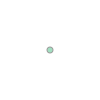

In [58]:
teste1 = geocode('Av. Paulista, 1578, São Paulo - SP')
teste1

Observação 1: o Nominatim não permite muitos queries de uma só vez. 1.4M de imóveis está muito acima do permitido na versão gratuita. Por isso, não é possível achar todas as coordenadas da base. Abaixo, um exemplo de como achar as coordenadas para os 10 imóveis que mais pagaram IPTU.

Observação 2: a geolocalização do Nominatim não 100% precisa. Alguns endereços, ainda mais os com algum erro na base original, podem indicar uma coordenada errada. Para evitar isso, busque sempre deixar o endereço inserido na API o mais limpo o possível.</br>
Algumas sugestões: colocar o nome da cidade, estado, CEP e bairro.</br>
Assim, funcionará na maior parte dos casos.

In [60]:
## 5.1.4 Rodar as funções
top10_iptu = iptu_nominatim.nlargest(10, 'iptu') # 10 maiores IPTUs da cidade
top10_iptu

,numero_contribuinte,lg_codlog,numero_imovel,cep,tipo_uso,valor_venal,iptu,lg_tipo,lg_titulo,lg_prep,lg_nome,endereco_completo
886337,0825170014-0,147001,S/N,05350-000,Escola,5809894104.60,110383487.99,AV,,,ESCOLA POLITECNICA,"Av. Escola Politecnica, S/N, São Paulo - SP"
1209812,0893200002-6,199311,S/N,04627-006,"Outras edificações de uso especial, com utiliz...",2630217516.65,49969632.82,AV,,,WASHINGTON LUIS,"Av. Washington Luis, S/N, São Paulo - SP"
678858,0361440003-4,106305,S/N,04094-050,"Outras edificações de uso especial, com utiliz...",1982321615.56,37659610.70,AV,,,PEDRO ALVARES CABRAL,"Av. Pedro Alvares Cabral, S/N, São Paulo - SP"
425543,0832290080-5,068977,2484,01451-000,Clube esportivo,1913956734.10,36360677.95,AV,BRIG,,FARIA LIMA,"Av. Brig Faria Lima, 2484, São Paulo - SP"
118487,1470010001-9,021814,5555,03527-904,"Outras edificações de uso comercial, com utili...",1480237509.08,28120012.67,AV,,,ARICANDUVA,"Av. Aricanduva, 5555, São Paulo - SP"
585478,1620510161-1,092207,6295,04777-001,"Outras edificações de uso coletivo, com utiliz...",1273338042.24,24188922.80,AV,,,INTERLAGOS,"Av. Interlagos, 6295, São Paulo - SP"
1240347,0856470727-6,215147,1089,04707-900,Loja em edifício em condomínio (unidade autônoma),1059355448.40,20123253.52,AV,,,ROQUE PETRONI JUNIOR,"Av. Roque Petroni Junior, 1089, São Paulo - SP"
425419,0832260340-1,068977,2232,01489-900,"Outras edificações de uso comercial, com utili...",1044639260.00,19843645.94,AV,BRIG,,FARIA LIMA,"Av. Brig Faria Lima, 2232, São Paulo - SP"
448968,0961280003-0,072575,1655,05461-010,"Outras edificações de uso especial, com utiliz...",952612559.30,18095138.63,AV,PROF,,FONSECA RODRIGUES,"Av. Prof Fonseca Rodrigues, 1655, São Paulo - SP"
1199899,0825170012-4,198170,S/N,05503-001,"Outras edificações de uso especial, com utiliz...",909753030.90,17280807.59,AV,,,VITAL BRASIL,"Av. Vital Brasil, S/N, São Paulo - SP"


In [61]:
teste2 = geocode('Av. Washington Luís, S/N, São Paulo - SP, 04627-006')
teste2 # Alguns lugares ele não acha

'NA'

In [62]:
top10_iptu['point_coord'] = top10_iptu['endereco_completo'].apply(geocode)
top10_iptu # Base com as coordenadas desses endereços. Usaremos para ver em qual bairro estão

C:\Users\vinic\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\pyproj\transformer.py:820: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return self._transformer._transform_point(
C:\Users\vinic\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\pyproj\transformer.py:820: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return self._transformer._transform_point(
C:\Users\vinic\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packag

,numero_contribuinte,lg_codlog,numero_imovel,cep,tipo_uso,valor_venal,iptu,lg_tipo,lg_titulo,lg_prep,lg_nome,endereco_completo,point_coord
886337,0825170014-0,147001,S/N,05350-000,Escola,5809894104.60,110383487.99,AV,,,ESCOLA POLITECNICA,"Av. Escola Politecnica, S/N, São Paulo - SP",POINT (-5202866.969564047 -2699429.938885444)
1209812,0893200002-6,199311,S/N,04627-006,"Outras edificações de uso especial, com utiliz...",2630217516.65,49969632.82,AV,,,WASHINGTON LUIS,"Av. Washington Luis, S/N, São Paulo - SP",POINT (-5210986.446243272 -2696474.951476349)
678858,0361440003-4,106305,S/N,04094-050,"Outras edificações de uso especial, com utiliz...",1982321615.56,37659610.70,AV,,,PEDRO ALVARES CABRAL,"Av. Pedro Alvares Cabral, S/N, São Paulo - SP",POINT (-5193683.634775207 -2702947.1955120903)
425543,0832290080-5,068977,2484,01451-000,Clube esportivo,1913956734.10,36360677.95,AV,BRIG,,FARIA LIMA,"Av. Brig Faria Lima, 2484, São Paulo - SP",POINT (-5196528.64926531 -2703753.884080886)
118487,1470010001-9,021814,5555,03527-904,"Outras edificações de uso comercial, com utili...",1480237509.08,28120012.67,AV,,,ARICANDUVA,"Av. Aricanduva, 5555, São Paulo - SP",POINT (-5176802.827082528 -2700611.0280060237)
585478,1620510161-1,092207,6295,04777-001,"Outras edificações de uso coletivo, com utiliz...",1273338042.24,24188922.80,AV,,,INTERLAGOS,"Av. Interlagos, 6295, São Paulo - SP",POINT (-5196113.79491897 -2713592.5880054287)
1240347,0856470727-6,215147,1089,04707-900,Loja em edifício em condomínio (unidade autônoma),1059355448.40,20123253.52,AV,,,ROQUE PETRONI JUNIOR,"Av. Roque Petroni Junior, 1089, São Paulo - SP",POINT (-5198458.099462438 -2707586.476963409)
425419,0832260340-1,068977,2232,01489-900,"Outras edificações de uso comercial, com utili...",1044639260.00,19843645.94,AV,BRIG,,FARIA LIMA,"Av. Brig Faria Lima, 2232, São Paulo - SP",POINT (-5196528.64926531 -2703753.884080886)
448968,0961280003-0,072575,1655,05461-010,"Outras edificações de uso especial, com utiliz...",952612559.30,18095138.63,AV,PROF,,FONSECA RODRIGUES,"Av. Prof Fonseca Rodrigues, 1655, São Paulo - SP",POINT (-5199618.377392022 -2699130.5089026284)
1199899,0825170012-4,198170,S/N,05503-001,"Outras edificações de uso especial, com utiliz...",909753030.90,17280807.59,AV,,,VITAL BRASIL,"Av. Vital Brasil, S/N, São Paulo - SP",POINT (-5200191.995596132 -2701040.802727165)


In [63]:
## 5.1.5 Cruzar com a base de distritos
top10_iptu.rename(columns = {'point_coord':'geometry'}, inplace = True) # Renomeia a coluna para poder transformar em GeoDataFrame
top10_iptu = top10_iptu[['numero_contribuinte','cep','endereco_completo','iptu','geometry']] # Seleciona as colunas de interesse (para simplificar)
top10_iptu = gpd.GeoDataFrame(top10_iptu, geometry = 'geometry') # Assegurar que é um GeoDataFrame

# Repetindo o código da seção 4
distritos_geometry = gpd.GeoDataFrame(distritos_geometry, geometry = 'geometry') # Assegurar que é um GeoDataFrame
distritos_geometry = distritos_geometry.set_crs("EPSG:31983") # Confirmar CRS

enderecos = distritos_subprefeituras.merge(distritos_geometry, on = 'cod_dist', how = 'outer') # adicionar geometry dos distritos ao dataset
enderecos = gpd.GeoDataFrame(enderecos, geometry = 'geometry') # Assegurar que é um GeoDataFrame

enderecos.to_crs = top10_iptu.crs

In [64]:
enderecos

,cod_dist,nome_dist,cod_sub,nome_sub,geometry
0,3,ANHANGUERA,01,PERUS,"POLYGON ((317544.550 7410560.045, 317548.660 7..."
1,61,PERUS,01,PERUS,"POLYGON ((325511.530 7409376.964, 325510.015 7..."
2,42,JARAGUA,02,PIRITUBA-JARAGUA,"POLYGON ((320069.659 7407622.486, 320069.992 7..."
3,63,PIRITUBA,02,PIRITUBA-JARAGUA,"POLYGON ((320981.891 7403049.322, 320979.930 7..."
4,95,SAO DOMINGOS,02,PIRITUBA-JARAGUA,"POLYGON ((320981.891 7403049.322, 320982.591 7..."
...,...,...,...,...,...
91,33,IGUATEMI,30,SAO MATEUS,"POLYGON ((357484.136 7387658.048, 357473.872 7..."
92,73,SAO MATEUS,30,SAO MATEUS,"POLYGON ((348002.169 7391379.700, 347994.017 7..."
93,75,SAO RAFAEL,30,SAO MATEUS,"POLYGON ((348943.829 7386656.753, 348946.667 7..."
94,25,CID TIRADENTES,31,CIDADE TIRADENTES,"POLYGON ((355350.639 7390194.343, 355354.193 7..."


In [65]:
top10_iptu

,numero_contribuinte,cep,endereco_completo,iptu,geometry
886337,0825170014-0,05350-000,"Av. Escola Politecnica, S/N, São Paulo - SP",110383487.99,POINT (-5202866.970 -2699429.939)
1209812,0893200002-6,04627-006,"Av. Washington Luis, S/N, São Paulo - SP",49969632.82,POINT (-5210986.446 -2696474.951)
678858,0361440003-4,04094-050,"Av. Pedro Alvares Cabral, S/N, São Paulo - SP",37659610.70,POINT (-5193683.635 -2702947.196)
425543,0832290080-5,01451-000,"Av. Brig Faria Lima, 2484, São Paulo - SP",36360677.95,POINT (-5196528.649 -2703753.884)
118487,1470010001-9,03527-904,"Av. Aricanduva, 5555, São Paulo - SP",28120012.67,POINT (-5176802.827 -2700611.028)
585478,1620510161-1,04777-001,"Av. Interlagos, 6295, São Paulo - SP",24188922.80,POINT (-5196113.795 -2713592.588)
1240347,0856470727-6,04707-900,"Av. Roque Petroni Junior, 1089, São Paulo - SP",20123253.52,POINT (-5198458.099 -2707586.477)
425419,0832260340-1,01489-900,"Av. Brig Faria Lima, 2232, São Paulo - SP",19843645.94,POINT (-5196528.649 -2703753.884)
448968,0961280003-0,05461-010,"Av. Prof Fonseca Rodrigues, 1655, São Paulo - SP",18095138.63,POINT (-5199618.377 -2699130.509)
1199899,0825170012-4,05503-001,"Av. Vital Brasil, S/N, São Paulo - SP",17280807.59,POINT (-5200191.996 -2701040.803)


In [121]:
top10_iptu_final = sjoin(enderecos, top10_iptu, how='right', op='intersects') # how = 'right': ficar com observacoes de top10_iptu
top10_iptu_final # Não deu match - deve ser algum erro na CRS das bases. A conferir

C:\Users\vinic\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\IPython\core\interactiveshell.py:3493: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):
C:\Users\vinic\AppData\Local\Temp\ipykernel_4984\2341588494.py:1: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:31983
Right CRS: None

  top10_iptu_final = sjoin(enderecos, top10_iptu, how='right', op='intersects') # how = 'right': ficar com observacoes de top10_iptu


,index_left,cod_dist,nome_dist,cod_sub,nome_sub,numero_contribuinte,cep,endereco_completo,iptu,geometry
886337,NaN,NaN,NaN,NaN,NaN,0825170014-0,05350-000,"Av. Escola Politecnica, S/N, São Paulo - SP",110383487.99,POINT (-5202866.970 -2699429.939)
1209812,NaN,NaN,NaN,NaN,NaN,0893200002-6,04627-006,"Av. Washington Luis, S/N, São Paulo - SP",49969632.82,POINT (-5210986.446 -2696474.951)
678858,NaN,NaN,NaN,NaN,NaN,0361440003-4,04094-050,"Av. Pedro Alvares Cabral, S/N, São Paulo - SP",37659610.70,POINT (-5193683.635 -2702947.196)
425543,NaN,NaN,NaN,NaN,NaN,0832290080-5,01451-000,"Av. Brig Faria Lima, 2484, São Paulo - SP",36360677.95,POINT (-5196528.649 -2703753.884)
118487,NaN,NaN,NaN,NaN,NaN,1470010001-9,03527-904,"Av. Aricanduva, 5555, São Paulo - SP",28120012.67,POINT (-5176802.827 -2700611.028)
585478,NaN,NaN,NaN,NaN,NaN,1620510161-1,04777-001,"Av. Interlagos, 6295, São Paulo - SP",24188922.80,POINT (-5196113.795 -2713592.588)
1240347,NaN,NaN,NaN,NaN,NaN,0856470727-6,04707-900,"Av. Roque Petroni Junior, 1089, São Paulo - SP",20123253.52,POINT (-5198458.099 -2707586.477)
425419,NaN,NaN,NaN,NaN,NaN,0832260340-1,01489-900,"Av. Brig Faria Lima, 2232, São Paulo - SP",19843645.94,POINT (-5196528.649 -2703753.884)
448968,NaN,NaN,NaN,NaN,NaN,0961280003-0,05461-010,"Av. Prof Fonseca Rodrigues, 1655, São Paulo - SP",18095138.63,POINT (-5199618.377 -2699130.509)
1199899,NaN,NaN,NaN,NaN,NaN,0825170012-4,05503-001,"Av. Vital Brasil, S/N, São Paulo - SP",17280807.59,POINT (-5200191.996 -2701040.803)


## 6. Perguntas

In [67]:
## Geometries distritos
distritos = distritos_sp_base.copy()  
distritos = distritos.sort_values(by = "cod_dist").reset_index(drop = True) # Orden por codigo do distrito e reseta o índice
distritos = distritos[['cod_dist','nome_dist','cod_sub','geometry']]
distritos_geometry = distritos[['nome_dist','geometry']] # Dataset com as geometries dos distritos
distritos_geometry

,nome_dist,geometry
0,AGUA RASA,"POLYGON ((338651.039 7392203.484, 338649.104 7..."
1,BRAS,"POLYGON ((335693.406 7394201.979, 335634.975 7..."
2,BRASILANDIA,"POLYGON ((324940.174 7404303.683, 324938.671 7..."
3,BUTANTA,"POLYGON ((320769.323 7390512.440, 320766.909 7..."
4,CACHOEIRINHA,"POLYGON ((330995.734 7402227.712, 330990.010 7..."
...,...,...
91,VILA MEDEIROS,"POLYGON ((338328.107 7402709.948, 338335.642 7..."
92,VILA PRUDENTE,"POLYGON ((338651.039 7392203.484, 338654.034 7..."
93,VILA SONIA,"POLYGON ((320402.478 7389551.141, 320413.955 7..."
94,SAO DOMINGOS,"POLYGON ((320981.891 7403049.322, 320982.591 7..."


In [68]:
## Geometries subprefeituras
subprefeituras = subprefeituras_sp_base.copy()
subprefeituras = subprefeituras[['sp_codigo','sp_nome','geometry']] # sp = subprefeitura (não é São Paulo)
subprefeituras = subprefeituras.rename(columns={'sp_codigo':'cod_sub','sp_nome':'nome_sub'})
subprefeituras_geometry = subprefeituras[['nome_sub','geometry']] # Dataset com as geometries das subprefeituras
subprefeituras_geometry

,nome_sub,geometry
0,PIRITUBA-JARAGUA,"POLYGON ((319192.002 7402406.415, 319192.339 7..."
1,FREGUESIA-BRASILANDIA,"POLYGON ((327469.803 7399113.522, 327449.180 7..."
2,CASA VERDE-CACHOEIRINHA,"POLYGON ((329079.913 7402343.759, 329082.494 7..."
3,VILA MARIA-VILA GUILHERME,"POLYGON ((336675.044 7401136.914, 336698.453 7..."
4,PENHA,"POLYGON ((341563.521 7399739.460, 341565.780 7..."
5,ERMELINO MATARAZZO,"POLYGON ((349086.305 7399600.645, 349096.094 7..."
6,ITAIM PAULISTA,"POLYGON ((356442.867 7397206.644, 356438.305 7..."
7,GUAIANASES,"POLYGON ((354736.042 7396035.315, 354700.624 7..."
8,LAPA,"POLYGON ((321650.450 7393534.651, 321634.456 7..."
9,SE,"POLYGON ((330175.535 7396046.238, 330181.745 7..."


In [69]:
localizacao_iptu_final

,numero_contribuinte,lg_codlog,numero_imovel,cep,tipo_uso,lg_tipo,lg_titulo,lg_prep,lg_nome,valor_venal,iptu,cod_dist,nome_dist,cod_sub,nome_sub,point_coord,endereco_completo
0,1671520205-1,000027,5,05859-040,"Residência coletiva, exclusive cortiço (mais d...",R,,,COUTO DE CALVAO,5068143.27,71522.15,19,CAPAO REDONDO,17,CAMPO LIMPO,POINT (319111.150 7381482.663),"R. Couto De Calvao, 5 - 05859-040, São Paulo..."
1,1671520150-0,000027,8,05859-040,Residência e outro uso (predominância residenc...,R,,,COUTO DE CALVAO,321623.34,2637.86,19,CAPAO REDONDO,17,CAMPO LIMPO,POINT (319111.150 7381482.663),"R. Couto De Calvao, 8 - 05859-040, São Paulo..."
2,1671520148-9,000027,9,05859-040,Residência,R,,,COUTO DE CALVAO,300256.88,2402.83,19,CAPAO REDONDO,17,CAMPO LIMPO,POINT (319111.150 7381482.663),"R. Couto De Calvao, 9 - 05859-040, São Paulo..."
3,0721780360-8,000043,15,02431-010,Residência,R,,DOS,ABACATEIROS,712779.48,5366.13,70,SANTANA,05,SANTANA-TUCURUVI,POINT (332670.613 7401672.087),"R. dos Abacateiros, 15 - 02431-010, São Paulo..."
4,0721780271-7,000043,19,02431-010,Loja e residência (predominância comercial),R,,DOS,ABACATEIROS,1660700.30,27053.31,70,SANTANA,05,SANTANA-TUCURUVI,POINT (332670.613 7401672.087),"R. dos Abacateiros, 19 - 02431-010, São Paulo..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1418826,1592740019-0,977535,215,05528-200,Residência,R,,,BARTOLOMEO BON,547107.54,5118.18,94,VILA SONIA,10,BUTANTA,POINT (320546.700 7389643.187),"R. Bartolomeo Bon, 215 - 05528-200, São Paul..."
1418827,1592820030-6,977535,220,05528-200,Residência,R,,,BARTOLOMEO BON,255837.78,2002.54,94,VILA SONIA,10,BUTANTA,POINT (320546.700 7389643.187),"R. Bartolomeo Bon, 220 - 05528-200, São Paul..."
1418828,1592740054-9,977535,241,05528-200,Residência,R,,,BARTOLOMEO BON,360480.00,3065.28,94,VILA SONIA,10,BUTANTA,POINT (320618.917 7389694.012),"R. Bartolomeo Bon, 241 - 05528-200, São Paul..."
1418829,1592740055-7,977535,247,05528-200,Residência,R,,,BARTOLOMEO BON,360480.00,3065.28,94,VILA SONIA,10,BUTANTA,POINT (320618.917 7389694.012),"R. Bartolomeo Bon, 247 - 05528-200, São Paul..."


### Questão 1
Which are the 3 areas deriving the highest and lowest tax revenues? How does it change when it comes to the property usage (commercial vs residential)?

In [70]:
## Q1 - A
# Agrupar os IPTUs por subprefeitura e somá-los. Depois ordenar para ver os distritos com maior arrecadação de IPTU
results = localizacao_iptu_final # Copiar resultados do item 5.1
results['iptu'] = pd.to_numeric(results['iptu'], errors='coerce') # Converter para float
results = results.groupby('nome_sub')['iptu'].sum().sort_values(ascending=False)
results = pd.DataFrame(results).reset_index()
results['milhoes_iptu'] = results['iptu']/10**6
results = results[results['nome_sub'] != '']
results['pct_total'] = results['iptu']/results['iptu'].sum()

C:\Users\vinic\AppData\Local\Temp\ipykernel_4984\2653525228.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  results['iptu'] = pd.to_numeric(results['iptu'], errors='coerce') # Converter para float


In [71]:
results_total = results['iptu'].sum()
results_total

13679899835.324154

In [72]:
results.head(4)

,nome_sub,iptu,milhoes_iptu,pct_total
0,PINHEIROS,2722532166.41,2722.53,0.20
1,VILA MARIANA,1452901245.92,1452.90,0.11
2,SE,1261432413.06,1261.43,0.09
3,SANTO AMARO,1167325284.74,1167.33,0.09


In [73]:
results.tail(4)

,nome_sub,iptu,milhoes_iptu,pct_total
28,GUAIANASES,35894072.68,35.89,0.00
30,PERUS,16647760.43,16.65,0.00
31,PARELHEIROS,15021455.04,15.02,0.00
32,CIDADE TIRADENTES,7958048.22,7.96,0.00


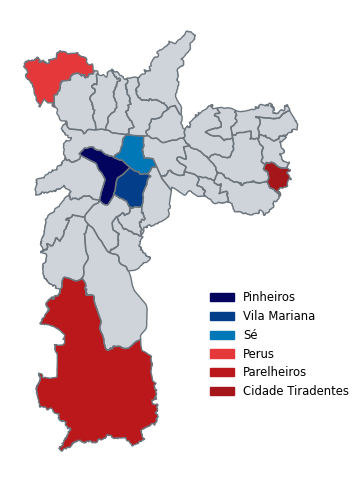

In [74]:
results_map = results.merge(subprefeituras_geometry, on = 'nome_sub', how='left') # Junção com as subprefeituras para recuperar as geometries
results_map = results_map[['nome_sub','iptu','milhoes_iptu','pct_total','geometry']] # Manter apenas as colunas que interessam
results_map = results_map.sort_values('iptu', ascending=False) # Ordenar por IPTU
results_map['highlight'] = 'no' # Coluna para destacar no mapa - vamos dar cores diferentes para o top 3 e bottom 3
results_map.loc[results_map.index[:1], 'highlight'] = 'top1' # Maior IPTU
results_map.loc[results_map.index[1:2], 'highlight'] = 'top2' # 2o maior IPTU
results_map.loc[results_map.index[2:3], 'highlight'] = 'top3' # 3o maior IPTU
results_map.loc[results_map.index[-3:], 'highlight'] = 'bottom3' # 3o menor IPTU
results_map.loc[results_map.index[-2:], 'highlight'] = 'bottom2' # 2o menor IPTU
results_map.loc[results_map.index[-1:], 'highlight'] = 'bottom1' # Menor IPTU
results_map = gpd.GeoDataFrame(results_map, geometry='geometry') # Garante que o dataframe é um geodataframe - se na hora de você plotar aparecer um gráfico, garante que é um geodataframe

gdf = results_map.copy()  # Fazer uma cópia para não alterar a base original o código do mapa ficar genérico
special_names = [gdf.iloc[0,0],gdf.iloc[1,0],gdf.iloc[2,0],gdf.iloc[-3,0],gdf.iloc[-2,0],gdf.iloc[-1,0]] # Nome dos distritos que vamos destacar
special_names = [s.title() for s in special_names] # LIKE THIS becomes Like This
special_names[2] = 'Sé'

color_map = {
    'top1': '#03045e', 'top2': '#023e8a', 'top3': '#0077b6',
    'bottom1': '#a4161a', 'bottom2': '#ba181b', 'bottom3': '#e5383b',
    'no': '#ced4da'
}  # Cores para destacar os distritos desejados

legend_labels = {
    'top1': special_names[0],
    'top2': special_names[1],
    'top3': special_names[2],
    'bottom3': special_names[-3],
    'bottom2': special_names[-2],
    'bottom1': special_names[-1],  # Last element of special_names
} # Labels da legend (são os elementos de special_names)

custom_order = ['top1', 'top2', 'top3', 'bottom3', 'bottom2', 'bottom1'] # Ordem dos elementos na legenda (da esquerda para a direita)

# Create the figure and axis
fig, ax = plt.subplots(1, 1, figsize=(13, 6)) # Tamanho do gráfico é 13x6

# Plot each neighborhood
for idx, row in gdf.iterrows():
    color = color_map[row['highlight']] # Cor do distrito
    gdf[gdf.index == idx].plot(ax=ax, color=color) # Plotar o distrito

# Highlight City Boundary
city_boundary = MultiPolygon(gdf['geometry'].tolist())
city_bound_gdf = gpd.GeoDataFrame(geometry=[city_boundary]) 
city_bound_gdf.plot(ax=ax, edgecolor = '#6c757d', linewidth = 1, facecolor = 'none') # Ajustar a cor da borda e a espessura da linha dos distritos

# Prepare legend
legend_elements = [mpatches.Patch(color=color_map[key], label=legend_labels[key]) # Criar a legenda
                   for key in custom_order if key in legend_labels]
ax.legend(handles=legend_elements, loc=(0.65,0.15), frameon=False, fontsize='small') # Estética da legenda

# Remove the axes
ax.set_axis_off() # Retirar os eixos
fig.savefig('q1_a.png', dpi=300, bbox_inches='tight')
plt.show() # Mostrar o gráfico

In [75]:
## Q1 - B
# Filtrar para residências, agrupar os IPTUs por distrito e somá-los. Depois ordenar para ver os distritos com maior arrecadação de IPTU
results = localizacao_iptu_final # Copiar resultados do item 5.1
results['iptu'] = pd.to_numeric(results['iptu'], errors='coerce') # Converter para float
results = results[results['tipo_uso'].isin(tipos_residenciais)] # Filtrar apenas residências (estão na lista tipos_residenciais)
results = results.groupby('nome_sub')['iptu'].sum().sort_values(ascending=False)
results = pd.DataFrame(results).reset_index()
results['milhoes_iptu'] = results['iptu']/10**6
results = results[results['nome_sub'] != '']
results['pct_total'] = results['iptu']/results['iptu'].sum()

C:\Users\vinic\AppData\Local\Temp\ipykernel_4984\633435787.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  results['iptu'] = pd.to_numeric(results['iptu'], errors='coerce') # Converter para float


In [76]:
results.head(4)

,nome_sub,iptu,milhoes_iptu,pct_total
0,PINHEIROS,929748568.32,929.75,0.17
1,VILA MARIANA,719925763.29,719.93,0.14
2,LAPA,420824117.80,420.82,0.08
3,SANTO AMARO,415902091.13,415.90,0.08


In [77]:
results.tail(4)

,nome_sub,iptu,milhoes_iptu,pct_total
28,GUAIANASES,17083700.07,17.08,0.00
29,PERUS,7415452.44,7.42,0.00
30,PARELHEIROS,5086954.84,5.09,0.00
32,CIDADE TIRADENTES,2151725.15,2.15,0.00


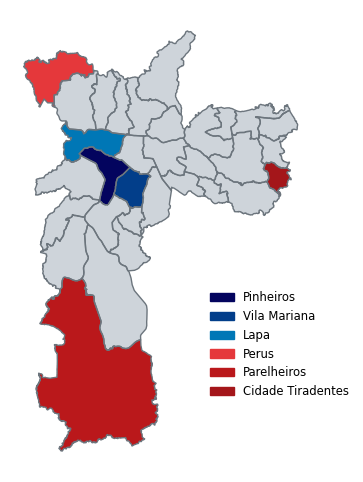

In [78]:
results_map = results.merge(subprefeituras_geometry, on = 'nome_sub', how='left') # Junção com as subprefeituras para recuperar as geometries
results_map = results_map[['nome_sub','iptu','milhoes_iptu','pct_total','geometry']] # Manter apenas as colunas que interessam
results_map = results_map.sort_values('iptu', ascending=False) # Ordenar por IPTU
results_map['highlight'] = 'no' # Coluna para destacar no mapa - vamos dar cores diferentes para o top 3 e bottom 3
results_map.loc[results_map.index[:1], 'highlight'] = 'top1' # Maior IPTU
results_map.loc[results_map.index[1:2], 'highlight'] = 'top2' # 2o maior IPTU
results_map.loc[results_map.index[2:3], 'highlight'] = 'top3' # 3o maior IPTU
results_map.loc[results_map.index[-3:], 'highlight'] = 'bottom3' # 3o menor IPTU
results_map.loc[results_map.index[-2:], 'highlight'] = 'bottom2' # 2o menor IPTU
results_map.loc[results_map.index[-1:], 'highlight'] = 'bottom1' # Menor IPTU
results_map = gpd.GeoDataFrame(results_map, geometry='geometry') # Garante que o dataframe é um geodataframe - se na hora de você plotar aparecer um gráfico, garante que é um geodataframe

gdf = results_map.copy()  # Fazer uma cópia para não alterar a base original o código do mapa ficar genérico
special_names = [gdf.iloc[0,0],gdf.iloc[1,0],gdf.iloc[2,0],gdf.iloc[-3,0],gdf.iloc[-2,0],gdf.iloc[-1,0]] # Nome dos distritos que vamos destacar
special_names = [s.title() for s in special_names] # LIKE THIS becomes Like This

color_map = {
    'top1': '#03045e', 'top2': '#023e8a', 'top3': '#0077b6',
    'bottom1': '#a4161a', 'bottom2': '#ba181b', 'bottom3': '#e5383b',
    'no': '#ced4da'
}  # Cores para destacar os distritos desejados

legend_labels = {
    'top1': special_names[0],
    'top2': special_names[1],
    'top3': special_names[2],
    'bottom3': special_names[-3],
    'bottom2': special_names[-2],
    'bottom1': special_names[-1],  # Last element of special_names
} # Labels da legend (são os elementos de special_names)

custom_order = ['top1', 'top2', 'top3', 'bottom3', 'bottom2', 'bottom1'] # Ordem dos elementos na legenda (da esquerda para a direita)

# Create the figure and axis
fig, ax = plt.subplots(1, 1, figsize=(13, 6)) # Tamanho do gráfico é 13x6

# Plot each neighborhood
for idx, row in gdf.iterrows():
    color = color_map[row['highlight']] # Cor do distrito
    gdf[gdf.index == idx].plot(ax=ax, color=color) # Plotar o distrito

# Highlight City Boundary
city_boundary = MultiPolygon(gdf['geometry'].tolist())
city_bound_gdf = gpd.GeoDataFrame(geometry=[city_boundary]) 
city_bound_gdf.plot(ax=ax, edgecolor = '#6c757d', linewidth = 1, facecolor = 'none') # Ajustar a cor da borda e a espessura da linha dos distritos

# Prepare legend
legend_elements = [mpatches.Patch(color=color_map[key], label=legend_labels[key]) # Criar a legenda
                   for key in custom_order if key in legend_labels]
ax.legend(handles=legend_elements, loc=(0.65,0.15), frameon=False, fontsize='small') # Estética da legenda

# Remove the axes
ax.set_axis_off() # Retirar os eixos
fig.savefig('q1_b.png', dpi=300, bbox_inches='tight')
plt.show() # Mostrar o gráfico

In [79]:
## Q1 - C
# Filtrar para não residências, agrupar os IPTUs por distrito e somá-los. Depois ordenar para ver os distritos com maior arrecadação de IPTU
results = localizacao_iptu_final # Copiar resultados do item 5.1
results['iptu'] = pd.to_numeric(results['iptu'], errors='coerce') # Converter para float
results = results[~results['tipo_uso'].isin(tipos_residenciais)] # Filtrar apenas não residências (não estão na lista tipos_residenciais)
results = results.groupby('nome_sub')['iptu'].sum().sort_values(ascending=False)
results = pd.DataFrame(results).reset_index()
results['milhoes_iptu'] = results['iptu']/10**6
results = results[results['nome_sub'] != '']
results['pct_total'] = results['iptu']/results['iptu'].sum()

C:\Users\vinic\AppData\Local\Temp\ipykernel_4984\1147350076.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  results['iptu'] = pd.to_numeric(results['iptu'], errors='coerce') # Converter para float


In [80]:
results.head(4)

,nome_sub,iptu,milhoes_iptu,pct_total
0,PINHEIROS,1792783598.08,1792.78,0.21
1,SE,926301843.02,926.30,0.11
2,SANTO AMARO,751423193.61,751.42,0.09
3,VILA MARIANA,732975482.64,732.98,0.09


In [81]:
results.tail(4)

,nome_sub,iptu,milhoes_iptu,pct_total
28,GUAIANASES,18810372.62,18.81,0.00
30,PARELHEIROS,9934500.19,9.93,0.00
31,PERUS,9232307.99,9.23,0.00
32,CIDADE TIRADENTES,5806323.07,5.81,0.00


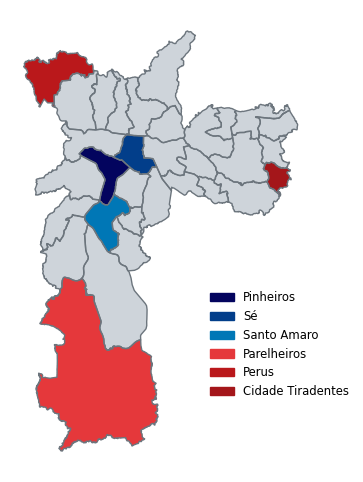

In [82]:
results_map = results.merge(subprefeituras_geometry, on = 'nome_sub', how='left') # Junção com as subprefeituras para recuperar as geometries
results_map = results_map[['nome_sub','iptu','milhoes_iptu','pct_total','geometry']] # Manter apenas as colunas que interessam
results_map = results_map.sort_values('iptu', ascending=False) # Ordenar por IPTU
results_map['highlight'] = 'no' # Coluna para destacar no mapa - vamos dar cores diferentes para o top 3 e bottom 3
results_map.loc[results_map.index[:1], 'highlight'] = 'top1' # Maior IPTU
results_map.loc[results_map.index[1:2], 'highlight'] = 'top2' # 2o maior IPTU
results_map.loc[results_map.index[2:3], 'highlight'] = 'top3' # 3o maior IPTU
results_map.loc[results_map.index[-3:], 'highlight'] = 'bottom3' # 3o menor IPTU
results_map.loc[results_map.index[-2:], 'highlight'] = 'bottom2' # 2o menor IPTU
results_map.loc[results_map.index[-1:], 'highlight'] = 'bottom1' # Menor IPTU
results_map = gpd.GeoDataFrame(results_map, geometry='geometry') # Garante que o dataframe é um geodataframe - se na hora de você plotar aparecer um gráfico, garante que é um geodataframe

gdf = results_map.copy()  # Fazer uma cópia para não alterar a base original o código do mapa ficar genérico
special_names = [gdf.iloc[0,0],gdf.iloc[1,0],gdf.iloc[2,0],gdf.iloc[-3,0],gdf.iloc[-2,0],gdf.iloc[-1,0]] # Nome dos distritos que vamos destacar
special_names = [s.title() for s in special_names] # LIKE THIS becomes Like This
special_names[1] = 'Sé'

color_map = {
    'top1': '#03045e', 'top2': '#023e8a', 'top3': '#0077b6',
    'bottom1': '#a4161a', 'bottom2': '#ba181b', 'bottom3': '#e5383b',
    'no': '#ced4da'
}  # Cores para destacar os distritos desejados

legend_labels = {
    'top1': special_names[0],
    'top2': special_names[1],
    'top3': special_names[2],
    'bottom3': special_names[-3],
    'bottom2': special_names[-2],
    'bottom1': special_names[-1],  # Last element of special_names
} # Labels da legend (são os elementos de special_names)

custom_order = ['top1', 'top2', 'top3', 'bottom3', 'bottom2', 'bottom1'] # Ordem dos elementos na legenda (da esquerda para a direita)

# Create the figure and axis
fig, ax = plt.subplots(1, 1, figsize=(13, 6)) # Tamanho do gráfico é 13x6

# Plot each neighborhood
for idx, row in gdf.iterrows():
    color = color_map[row['highlight']] # Cor do distrito
    gdf[gdf.index == idx].plot(ax=ax, color=color) # Plotar o distrito

# Highlight City Boundary
city_boundary = MultiPolygon(gdf['geometry'].tolist())
city_bound_gdf = gpd.GeoDataFrame(geometry=[city_boundary]) 
city_bound_gdf.plot(ax=ax, edgecolor = '#6c757d', linewidth = 1, facecolor = 'none') # Ajustar a cor da borda e a espessura da linha dos distritos

# Prepare legend
legend_elements = [mpatches.Patch(color=color_map[key], label=legend_labels[key]) # Criar a legenda
                   for key in custom_order if key in legend_labels]
ax.legend(handles=legend_elements, loc=(0.65,0.15), frameon=False, fontsize='small') # Estética da legenda

# Remove the axes
ax.set_axis_off() # Retirar os eixos
fig.savefig('q1_c.png', dpi=300, bbox_inches='tight')
plt.show() # Mostrar o gráfico

## Questão 2
How does this result changes when analyzing the data at the neighborhood level?

In [83]:
## Q2 - A
# Agrupar os IPTUs por subprefeitura e somá-los. Depois ordenar para ver os distritos com maior arrecadação de IPTU
results = localizacao_iptu_final # Copiar resultados do item 5.1
results['iptu'] = pd.to_numeric(results['iptu'], errors='coerce') # Converter para float
results = results.groupby('nome_dist')['iptu'].sum().sort_values(ascending=False)
results = pd.DataFrame(results).reset_index()
results['milhoes_iptu'] = results['iptu']/10**6
results['pct_total'] = results['iptu']/results['iptu'].sum()

C:\Users\vinic\AppData\Local\Temp\ipykernel_4984\2955220193.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  results['iptu'] = pd.to_numeric(results['iptu'], errors='coerce') # Converter para float


In [84]:
results.head(4)

,nome_dist,iptu,milhoes_iptu,pct_total
0,ITAIM BIBI,1145445762.90,1145.45,0.08
1,JD PAULISTA,716990488.71,716.99,0.05
2,PINHEIROS,645929451.89,645.93,0.05
3,SANTO AMARO,632099019.88,632.10,0.05


In [85]:
results.tail(4)

,nome_dist,iptu,milhoes_iptu,pct_total
93,PERUS,9328230.44,9.33,0.00
94,CID TIRADENTES,7958048.22,7.96,0.00
95,ANHANGUERA,7319530.00,7.32,0.00
96,MARSILAC,351400.42,0.35,0.00


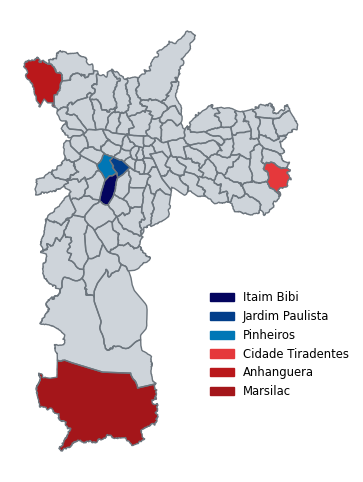

In [86]:
results_map = results.merge(distritos_geometry, on = 'nome_dist', how='left') # Junção com as subprefeituras para recuperar as geometries
results_map = results_map[['nome_dist','iptu','milhoes_iptu','pct_total','geometry']] # Manter apenas as colunas que interessam
results_map = results_map.sort_values('iptu', ascending=False) # Ordenar por IPTU
results_map['highlight'] = 'no' # Coluna para destacar no mapa - vamos dar cores diferentes para o top 3 e bottom 3
results_map.loc[results_map.index[:1], 'highlight'] = 'top1' # Maior IPTU
results_map.loc[results_map.index[1:2], 'highlight'] = 'top2' # 2o maior IPTU
results_map.loc[results_map.index[2:3], 'highlight'] = 'top3' # 3o maior IPTU
results_map.loc[results_map.index[-3:], 'highlight'] = 'bottom3' # 3o menor IPTU
results_map.loc[results_map.index[-2:], 'highlight'] = 'bottom2' # 2o menor IPTU
results_map.loc[results_map.index[-1:], 'highlight'] = 'bottom1' # Menor IPTU
results_map = gpd.GeoDataFrame(results_map, geometry='geometry') # Garante que o dataframe é um geodataframe - se na hora de você plotar aparecer um gráfico, garante que é um geodataframe

gdf = results_map.copy()  # Fazer uma cópia para não alterar a base original o código do mapa ficar genérico
special_names = [gdf.iloc[0,0],gdf.iloc[1,0],gdf.iloc[2,0],gdf.iloc[-3,0],gdf.iloc[-2,0],gdf.iloc[-1,0]] # Nome dos distritos que vamos destacar
special_names = [s.title() for s in special_names] # LIKE THIS becomes Like This
special_names[1] = 'Jardim Paulista'
special_names[3] = 'Cidade Tiradentes'

color_map = {
    'top1': '#03045e', 'top2': '#023e8a', 'top3': '#0077b6',
    'bottom1': '#a4161a', 'bottom2': '#ba181b', 'bottom3': '#e5383b',
    'no': '#ced4da'
}  # Cores para destacar os distritos desejados

legend_labels = {
    'top1': special_names[0],
    'top2': special_names[1],
    'top3': special_names[2],
    'bottom3': special_names[-3],
    'bottom2': special_names[-2],
    'bottom1': special_names[-1],  # Last element of special_names
} # Labels da legend (são os elementos de special_names)

custom_order = ['top1', 'top2', 'top3', 'bottom3', 'bottom2', 'bottom1'] # Ordem dos elementos na legenda (da esquerda para a direita)

# Create the figure and axis
fig, ax = plt.subplots(1, 1, figsize=(13, 6)) # Tamanho do gráfico é 13x6

# Plot each neighborhood
for idx, row in gdf.iterrows():
    color = color_map[row['highlight']] # Cor do distrito
    gdf[gdf.index == idx].plot(ax=ax, color=color) # Plotar o distrito

# Highlight City Boundary
city_boundary = MultiPolygon(gdf['geometry'].tolist())
city_bound_gdf = gpd.GeoDataFrame(geometry=[city_boundary]) 
city_bound_gdf.plot(ax=ax, edgecolor = '#6c757d', linewidth = 1, facecolor = 'none') # Ajustar a cor da borda e a espessura da linha dos distritos

# Prepare legend
legend_elements = [mpatches.Patch(color=color_map[key], label=legend_labels[key]) # Criar a legenda
                   for key in custom_order if key in legend_labels]
ax.legend(handles=legend_elements, loc=(0.65,0.15), frameon=False, fontsize='small') # Estética da legenda

# Remove the axes
ax.set_axis_off() # Retirar os eixos
fig.savefig('q2_a.png', dpi=300, bbox_inches='tight')
plt.show() # Mostrar o gráfico

In [87]:
## Q2 - B
# Filtrar para residências, agrupar os IPTUs por distrito e somá-los. Depois ordenar para ver os distritos com maior arrecadação de IPTU
results = localizacao_iptu_final # Copiar resultados do item 5.1
results['iptu'] = pd.to_numeric(results['iptu'], errors='coerce') # Converter para float
results = results[results['tipo_uso'].isin(tipos_residenciais)] # Filtrar apenas residências (estão na lista tipos_residenciais)
results = results.groupby('nome_dist')['iptu'].sum().sort_values(ascending=False)
results = pd.DataFrame(results).reset_index()
results['milhoes_iptu'] = results['iptu']/10**6
results = results[results['nome_dist'] != '']
results['pct_total'] = results['iptu']/results['iptu'].sum()

C:\Users\vinic\AppData\Local\Temp\ipykernel_4984\2912557584.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  results['iptu'] = pd.to_numeric(results['iptu'], errors='coerce') # Converter para float


In [88]:
results.head(4)

,nome_dist,iptu,milhoes_iptu,pct_total
0,MOEMA,312672592.22,312.67,0.06
1,ITAIM BIBI,293168514.85,293.17,0.06
2,JD PAULISTA,255644582.23,255.64,0.05
3,PINHEIROS,248327092.04,248.33,0.05


In [89]:
results.tail(4)

,nome_dist,iptu,milhoes_iptu,pct_total
93,PERUS,3514010.69,3.51,0.00
94,SE,2388040.97,2.39,0.00
95,CID TIRADENTES,2151725.15,2.15,0.00
96,MARSILAC,326398.51,0.33,0.00


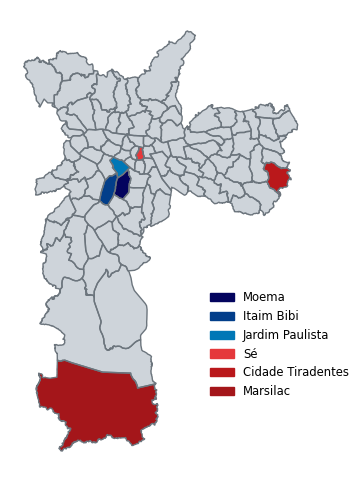

In [90]:
results_map = results.merge(distritos_geometry, on = 'nome_dist', how='left') # Junção com as subprefeituras para recuperar as geometries
results_map = results_map[['nome_dist','iptu','milhoes_iptu','pct_total','geometry']] # Manter apenas as colunas que interessam
results_map = results_map.sort_values('iptu', ascending=False) # Ordenar por IPTU
results_map['highlight'] = 'no' # Coluna para destacar no mapa - vamos dar cores diferentes para o top 3 e bottom 3
results_map.loc[results_map.index[:1], 'highlight'] = 'top1' # Maior IPTU
results_map.loc[results_map.index[1:2], 'highlight'] = 'top2' # 2o maior IPTU
results_map.loc[results_map.index[2:3], 'highlight'] = 'top3' # 3o maior IPTU
results_map.loc[results_map.index[-3:], 'highlight'] = 'bottom3' # 3o menor IPTU
results_map.loc[results_map.index[-2:], 'highlight'] = 'bottom2' # 2o menor IPTU
results_map.loc[results_map.index[-1:], 'highlight'] = 'bottom1' # Menor IPTU
results_map = gpd.GeoDataFrame(results_map, geometry='geometry') # Garante que o dataframe é um geodataframe - se na hora de você plotar aparecer um gráfico, garante que é um geodataframe

gdf = results_map.copy()  # Fazer uma cópia para não alterar a base original o código do mapa ficar genérico
special_names = [gdf.iloc[0,0],gdf.iloc[1,0],gdf.iloc[2,0],gdf.iloc[-3,0],gdf.iloc[-2,0],gdf.iloc[-1,0]] # Nome dos distritos que vamos destacar
special_names = [s.title() for s in special_names] # LIKE THIS becomes Like This
special_names[2] = 'Jardim Paulista'
special_names[3] = 'Sé'
special_names[4] = 'Cidade Tiradentes'

color_map = {
    'top1': '#03045e', 'top2': '#023e8a', 'top3': '#0077b6',
    'bottom1': '#a4161a', 'bottom2': '#ba181b', 'bottom3': '#e5383b',
    'no': '#ced4da'
}  # Cores para destacar os distritos desejados

legend_labels = {
    'top1': special_names[0],
    'top2': special_names[1],
    'top3': special_names[2],
    'bottom3': special_names[-3],
    'bottom2': special_names[-2],
    'bottom1': special_names[-1],  # Last element of special_names
} # Labels da legend (são os elementos de special_names)

custom_order = ['top1', 'top2', 'top3', 'bottom3', 'bottom2', 'bottom1'] # Ordem dos elementos na legenda (da esquerda para a direita)

# Create the figure and axis
fig, ax = plt.subplots(1, 1, figsize=(13, 6)) # Tamanho do gráfico é 13x6

# Plot each neighborhood
for idx, row in gdf.iterrows():
    color = color_map[row['highlight']] # Cor do distrito
    gdf[gdf.index == idx].plot(ax=ax, color=color) # Plotar o distrito

# Highlight City Boundary
city_boundary = MultiPolygon(gdf['geometry'].tolist())
city_bound_gdf = gpd.GeoDataFrame(geometry=[city_boundary]) 
city_bound_gdf.plot(ax=ax, edgecolor = '#6c757d', linewidth = 1, facecolor = 'none') # Ajustar a cor da borda e a espessura da linha dos distritos

# Prepare legend
legend_elements = [mpatches.Patch(color=color_map[key], label=legend_labels[key]) # Criar a legenda
                   for key in custom_order if key in legend_labels]
ax.legend(handles=legend_elements, loc=(0.65,0.15), frameon=False, fontsize='small') # Estética da legenda

# Remove the axes
ax.set_axis_off() # Retirar os eixos
fig.savefig('q2_b.png', dpi=300, bbox_inches='tight')
plt.show() # Mostrar o gráfico

In [91]:
## Q1 - C
# Filtrar para não residências, agrupar os IPTUs por distrito e somá-los. Depois ordenar para ver os distritos com maior arrecadação de IPTU
results = localizacao_iptu_final # Copiar resultados do item 5.1
results['iptu'] = pd.to_numeric(results['iptu'], errors='coerce') # Converter para float
results = results[~results['tipo_uso'].isin(tipos_residenciais)] # Filtrar apenas não residências (não estão na lista tipos_residenciais)
results = results.groupby('nome_dist')['iptu'].sum().sort_values(ascending=False)
results = pd.DataFrame(results).reset_index()
results['milhoes_iptu'] = results['iptu']/10**6
results = results[results['nome_dist'] != '']
results['pct_total'] = results['iptu']/results['iptu'].sum()

C:\Users\vinic\AppData\Local\Temp\ipykernel_4984\3022887137.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  results['iptu'] = pd.to_numeric(results['iptu'], errors='coerce') # Converter para float


In [92]:
results.head(4)

,nome_dist,iptu,milhoes_iptu,pct_total
0,ITAIM BIBI,852277248.05,852.28,0.10
1,SANTO AMARO,461792399.39,461.79,0.06
2,JD PAULISTA,461345906.49,461.35,0.06
3,PINHEIROS,397602359.84,397.60,0.05


In [93]:
results.tail(4)

,nome_dist,iptu,milhoes_iptu,pct_total
93,PERUS,5814219.75,5.81,0.00
94,CID TIRADENTES,5806323.07,5.81,0.00
95,ANHANGUERA,3418088.25,3.42,0.00
96,MARSILAC,25001.92,0.03,0.00


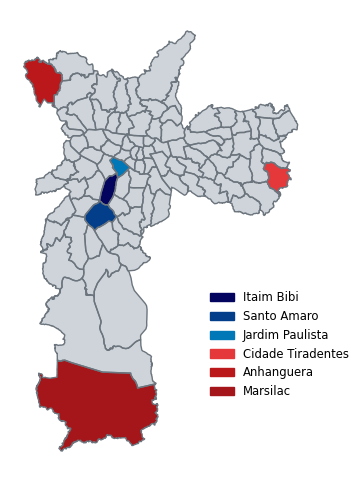

In [94]:
results_map = results.merge(distritos_geometry, on = 'nome_dist', how='left') # Junção com as subprefeituras para recuperar as geometries
results_map = results_map[['nome_dist','iptu','milhoes_iptu','pct_total','geometry']] # Manter apenas as colunas que interessam
results_map = results_map.sort_values('iptu', ascending=False) # Ordenar por IPTU
results_map['highlight'] = 'no' # Coluna para destacar no mapa - vamos dar cores diferentes para o top 3 e bottom 3
results_map.loc[results_map.index[:1], 'highlight'] = 'top1' # Maior IPTU
results_map.loc[results_map.index[1:2], 'highlight'] = 'top2' # 2o maior IPTU
results_map.loc[results_map.index[2:3], 'highlight'] = 'top3' # 3o maior IPTU
results_map.loc[results_map.index[-3:], 'highlight'] = 'bottom3' # 3o menor IPTU
results_map.loc[results_map.index[-2:], 'highlight'] = 'bottom2' # 2o menor IPTU
results_map.loc[results_map.index[-1:], 'highlight'] = 'bottom1' # Menor IPTU
results_map = gpd.GeoDataFrame(results_map, geometry='geometry') # Garante que o dataframe é um geodataframe - se na hora de você plotar aparecer um gráfico, garante que é um geodataframe

gdf = results_map.copy()  # Fazer uma cópia para não alterar a base original o código do mapa ficar genérico
special_names = [gdf.iloc[0,0],gdf.iloc[1,0],gdf.iloc[2,0],gdf.iloc[-3,0],gdf.iloc[-2,0],gdf.iloc[-1,0]] # Nome dos distritos que vamos destacar
special_names = [s.title() for s in special_names] # LIKE THIS becomes Like This
special_names[2] = 'Jardim Paulista'
special_names[3] = 'Cidade Tiradentes'

color_map = {
    'top1': '#03045e', 'top2': '#023e8a', 'top3': '#0077b6',
    'bottom1': '#a4161a', 'bottom2': '#ba181b', 'bottom3': '#e5383b',
    'no': '#ced4da'
}  # Cores para destacar os distritos desejados

legend_labels = {
    'top1': special_names[0],
    'top2': special_names[1],
    'top3': special_names[2],
    'bottom3': special_names[-3],
    'bottom2': special_names[-2],
    'bottom1': special_names[-1],  # Last element of special_names
} # Labels da legend (são os elementos de special_names)

custom_order = ['top1', 'top2', 'top3', 'bottom3', 'bottom2', 'bottom1'] # Ordem dos elementos na legenda (da esquerda para a direita)

# Create the figure and axis
fig, ax = plt.subplots(1, 1, figsize=(13, 6)) # Tamanho do gráfico é 13x6

# Plot each neighborhood
for idx, row in gdf.iterrows():
    color = color_map[row['highlight']] # Cor do distrito
    gdf[gdf.index == idx].plot(ax=ax, color=color) # Plotar o distrito

# Highlight City Boundary
city_boundary = MultiPolygon(gdf['geometry'].tolist())
city_bound_gdf = gpd.GeoDataFrame(geometry=[city_boundary]) 
city_bound_gdf.plot(ax=ax, edgecolor = '#6c757d', linewidth = 1, facecolor = 'none') # Ajustar a cor da borda e a espessura da linha dos distritos

# Prepare legend
legend_elements = [mpatches.Patch(color=color_map[key], label=legend_labels[key]) # Criar a legenda
                   for key in custom_order if key in legend_labels]
ax.legend(handles=legend_elements, loc=(0.65,0.15), frameon=False, fontsize='small') # Estética da legenda

# Remove the axes
ax.set_axis_off() # Retirar os eixos
fig.savefig('q2_c.png', dpi=300, bbox_inches='tight')
plt.show() # Mostrar o gráfico

## Questão 3
How does it changes when analyzing at street level? (CODL)

In [95]:
localizacao_iptu_final

,numero_contribuinte,lg_codlog,numero_imovel,cep,tipo_uso,lg_tipo,lg_titulo,lg_prep,lg_nome,valor_venal,iptu,cod_dist,nome_dist,cod_sub,nome_sub,point_coord,endereco_completo
0,1671520205-1,000027,5,05859-040,"Residência coletiva, exclusive cortiço (mais d...",R,,,COUTO DE CALVAO,5068143.27,71522.15,19,CAPAO REDONDO,17,CAMPO LIMPO,POINT (319111.150 7381482.663),"R. Couto De Calvao, 5 - 05859-040, São Paulo..."
1,1671520150-0,000027,8,05859-040,Residência e outro uso (predominância residenc...,R,,,COUTO DE CALVAO,321623.34,2637.86,19,CAPAO REDONDO,17,CAMPO LIMPO,POINT (319111.150 7381482.663),"R. Couto De Calvao, 8 - 05859-040, São Paulo..."
2,1671520148-9,000027,9,05859-040,Residência,R,,,COUTO DE CALVAO,300256.88,2402.83,19,CAPAO REDONDO,17,CAMPO LIMPO,POINT (319111.150 7381482.663),"R. Couto De Calvao, 9 - 05859-040, São Paulo..."
3,0721780360-8,000043,15,02431-010,Residência,R,,DOS,ABACATEIROS,712779.48,5366.13,70,SANTANA,05,SANTANA-TUCURUVI,POINT (332670.613 7401672.087),"R. dos Abacateiros, 15 - 02431-010, São Paulo..."
4,0721780271-7,000043,19,02431-010,Loja e residência (predominância comercial),R,,DOS,ABACATEIROS,1660700.30,27053.31,70,SANTANA,05,SANTANA-TUCURUVI,POINT (332670.613 7401672.087),"R. dos Abacateiros, 19 - 02431-010, São Paulo..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1418826,1592740019-0,977535,215,05528-200,Residência,R,,,BARTOLOMEO BON,547107.54,5118.18,94,VILA SONIA,10,BUTANTA,POINT (320546.700 7389643.187),"R. Bartolomeo Bon, 215 - 05528-200, São Paul..."
1418827,1592820030-6,977535,220,05528-200,Residência,R,,,BARTOLOMEO BON,255837.78,2002.54,94,VILA SONIA,10,BUTANTA,POINT (320546.700 7389643.187),"R. Bartolomeo Bon, 220 - 05528-200, São Paul..."
1418828,1592740054-9,977535,241,05528-200,Residência,R,,,BARTOLOMEO BON,360480.00,3065.28,94,VILA SONIA,10,BUTANTA,POINT (320618.917 7389694.012),"R. Bartolomeo Bon, 241 - 05528-200, São Paul..."
1418829,1592740055-7,977535,247,05528-200,Residência,R,,,BARTOLOMEO BON,360480.00,3065.28,94,VILA SONIA,10,BUTANTA,POINT (320618.917 7389694.012),"R. Bartolomeo Bon, 247 - 05528-200, São Paul..."


In [96]:
results = localizacao_iptu_final.groupby('lg_codlog')['iptu'].sum()
results = pd.DataFrame(results).reset_index()
results = results.sort_values('iptu', ascending=False)
top5_results = results.head(5)
top5_results

,lg_codlog,iptu
5277,062383,242807336.61
5825,068977,191458326.02
13131,156566,174024894.85
10393,123269,127834372.52
12324,147001,127386086.18


In [97]:
top5_results = top5_results.merge(logradouros_unicos, on = 'lg_codlog', how='left')
top5_results

,lg_codlog,iptu,lg_tipo,lg_titulo,lg_prep,lg_nome
0,062383,242807336.61,AV,None,DAS,NACOES UNIDAS
1,068977,191458326.02,AV,BRIG,None,FARIA LIMA
2,156566,174024894.85,AV,None,None,PAULISTA
3,123269,127834372.52,AV,PRES,None,JUSCELINO KUBITSCHEK
4,147001,127386086.18,AV,None,None,ESCOLA POLITECNICA


In [98]:
codlog_top5 = top5_results['lg_codlog'].tolist() # Lista com os codlogs das top 5 ruas
geometries_top5 = logradouros.query('lg_codlog in @codlog_top5') # Filtar na base de logradouros para extrair as geometries das top 5 ruas
geometries_top5 = geometries_top5.groupby('lg_codlog')['geometry'].apply(lambda x: unary_union(x.tolist())).reset_index() # unary_union: agrega todas as geometries em uma geometry só (se for polygonal, pega todas as bordas)
geometries_top5

,lg_codlog,geometry
0,062383,"MULTILINESTRING ((327462.724 7390718.952, 3274..."
1,068977,"MULTILINESTRING ((326810.572 7393529.730, 3268..."
2,123269,"MULTILINESTRING ((327453.610 7390195.294, 3274..."
3,147001,"MULTILINESTRING ((323151.265 7394653.996, 3231..."
4,156566,"MULTILINESTRING ((332201.773 7392275.973, 3320..."


In [99]:
top5_results = top5_results.merge(geometries_top5, on = 'lg_codlog', how = 'left') # how = left: preserva as linhas de top5_results
top5_results = top5_results.fillna('') # NA vira espaço (para poder rodar a linha abaixo)
top5_results['endereco_completo'] = top5_results['lg_tipo'].str.title() + '. ' + top5_results['lg_titulo'].str.title() + ' ' + top5_results['lg_prep'].str.lower() + ' ' + top5_results['lg_nome'].str.title()
top5_results = top5_results[['lg_codlog','endereco_completo','iptu','geometry']]
top5_results

,lg_codlog,endereco_completo,iptu,geometry
0,062383,Av. das Nacoes Unidas,242807336.61,"MULTILINESTRING ((327462.724 7390718.952, 3274..."
1,068977,Av. Brig Faria Lima,191458326.02,"MULTILINESTRING ((326810.572 7393529.730, 3268..."
2,156566,Av. Paulista,174024894.85,"MULTILINESTRING ((332201.773 7392275.973, 3320..."
3,123269,Av. Pres Juscelino Kubitschek,127834372.52,"MULTILINESTRING ((327453.610 7390195.294, 3274..."
4,147001,Av. Escola Politecnica,127386086.18,"MULTILINESTRING ((323151.265 7394653.996, 3231..."


In [100]:
top5_results = gpd.GeoDataFrame(top5_results, geometry = 'geometry') # Garantir que é um geodataframe

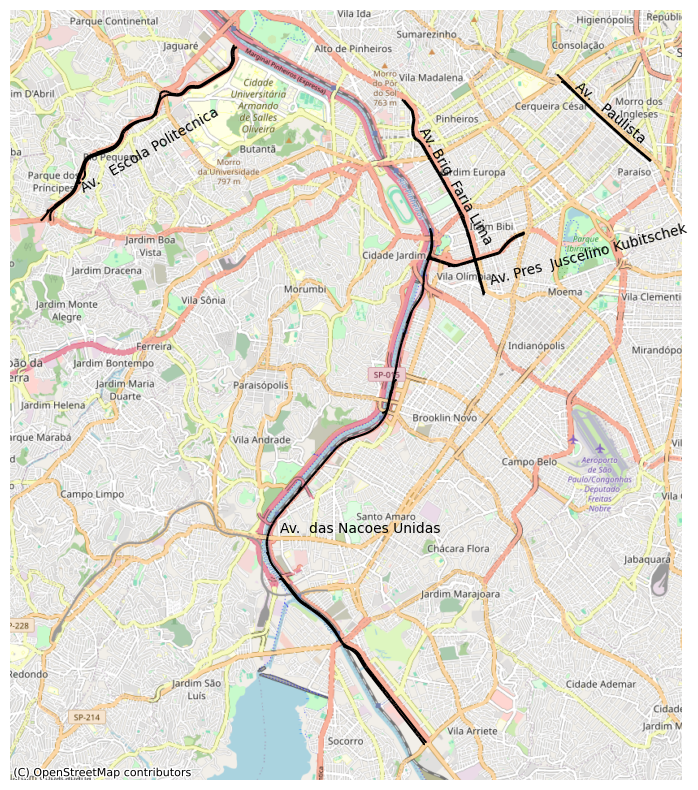

In [113]:
df = top5_results.copy()

df = df.set_crs(epsg=29193)
df_wm = df.to_crs(epsg=3857) # wm = Web Mercator

rotation_angles = {
    top5_results.iloc[0, 1]: 0,
    top5_results.iloc[1, 1]: -60,
    top5_results.iloc[2, 1]: -40,
    top5_results.iloc[3, 1]: 15,
    top5_results.iloc[4, 1]: 30
} # Definir angulos específicos para cada rua

text_offset_x = {
    top5_results.iloc[0, 1]: 0,
    top5_results.iloc[1, 1]: 200,
    top5_results.iloc[2, 1]: 150,
    top5_results.iloc[3, 1]: 2600,
    top5_results.iloc[4, 1]: 400
} # Definir offsets específicos para cada rua (quanto o texto se move horizontalmente)
text_offset_y = {
    top5_results.iloc[0, 1]: 0,
    top5_results.iloc[1, 1]: 200,
    top5_results.iloc[2, 1]: 150,
    top5_results.iloc[3, 1]: 0,
    top5_results.iloc[4, 1]: -400
} # Definir offsets específicos para cada rua (quanto o texto se move verticalmente)

# Plotting
fig, ax = plt.subplots(figsize=(10, 10))
df_wm.plot(ax=ax, alpha=1, edgecolor="black")

# Add street names with manual rotation and offsets
for idx, row in df_wm.iterrows():
    name = row['endereco_completo']
    centroid = row['geometry'].centroid
    angle = rotation_angles.get(name, 0)  # Default rotation angle is 0
    offset_x = text_offset_x.get(name, 0)  # Default x offset is 0
    offset_y = text_offset_y.get(name, 0)  # Default y offset is 0
    plt.text(centroid.x + offset_x, centroid.y + offset_y, name, ha = 'center', va = 'center', rotation = angle)

# Add the basemap
cx.add_basemap(ax, source=cx.providers.OpenStreetMap.Mapnik)

# Hide axis
ax.set_axis_off()

# Salvar arquivo no diretório
plt.savefig('top5_streets.png', dpi=300, bbox_inches='tight')

plt.show()


## Top 10 Imóveis


In [122]:
top10_iptu_final = top10_iptu_final[['endereco_completo','cep','iptu','geometry']]
top10_iptu_final['rank'] = range(1,11)
top10_iptu_final['endereco_completo'] = top10_iptu_final['endereco_completo'].str.replace(', São Paulo, SP', '')
top10_iptu_final = gpd.GeoDataFrame(top10_iptu_final, geometry = 'geometry')
top10_iptu_final

C:\Users\vinic\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\geopandas\geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


,endereco_completo,cep,iptu,geometry,rank
886337,"Av. Escola Politecnica, S/N, São Paulo - SP",05350-000,110383487.99,POINT (-5202866.970 -2699429.939),1
1209812,"Av. Washington Luis, S/N, São Paulo - SP",04627-006,49969632.82,POINT (-5210986.446 -2696474.951),2
678858,"Av. Pedro Alvares Cabral, S/N, São Paulo - SP",04094-050,37659610.70,POINT (-5193683.635 -2702947.196),3
425543,"Av. Brig Faria Lima, 2484, São Paulo - SP",01451-000,36360677.95,POINT (-5196528.649 -2703753.884),4
118487,"Av. Aricanduva, 5555, São Paulo - SP",03527-904,28120012.67,POINT (-5176802.827 -2700611.028),5
585478,"Av. Interlagos, 6295, São Paulo - SP",04777-001,24188922.80,POINT (-5196113.795 -2713592.588),6
1240347,"Av. Roque Petroni Junior, 1089, São Paulo - SP",04707-900,20123253.52,POINT (-5198458.099 -2707586.477),7
425419,"Av. Brig Faria Lima, 2232, São Paulo - SP",01489-900,19843645.94,POINT (-5196528.649 -2703753.884),8
448968,"Av. Prof Fonseca Rodrigues, 1655, São Paulo - SP",05461-010,18095138.63,POINT (-5199618.377 -2699130.509),9
1199899,"Av. Vital Brasil, S/N, São Paulo - SP",05503-001,17280807.59,POINT (-5200191.996 -2701040.803),10


In [126]:
## Problemas
# 1. Nominatim não consegue localizar o segundo endereço - Aeroporto de Congonhas - por nada. Vamos adicionar a geometria manualemnte
# 2. Endereços 4 e 8 são muito próximos e tem overlapping no plot. Vamos mover 8 - Av. Brig Faria Lima, 2232 - um pouco.


In [ ]:
# Coordenadas de Congonhas: longitude = -46.65503, latitude = -23.62695 (mas estão em EPSG:4326 - WGS 84)
transformer = Transformer.from_crs("EPSG:4326", "EPSG:3857") # 4326 = latitude e longitude, 3857 = Web Mercator (como o resto do df)
lat = -23.62695
long = -46.65503
congonhas_coord = transformer.transform(lat, long)
top10_iptu_final.iloc[1, 3] = Point(congonhas_coord) # Atualizar a geometria do Aeroporto de Congonhas


In [131]:
# Mover a Av. Brig Faria Lima, 2232 na direção NW
x_original = -5196528.649 # Já está em EPSG:3857 - usa distância para geolocalizar pontos
y_original = -2703253.884

# Metros movidos em cada direção
north_mov = 500
west_mov = 300

# Novas coords
new_y = y_original + north_mov
new_x = x_original - west_mov

new_coords = (new_x, new_y)
new_coords
top10_iptu_final.iloc[7, 3] = Point(new_coords)

In [127]:
top10_iptu_final

,endereco_completo,cep,iptu,geometry,rank
886337,"Av. Escola Politecnica, S/N, São Paulo - SP",05350-000,110383487.99,POINT (-5202866.970 -2699429.939),1
1209812,"Av. Washington Luis, S/N, São Paulo - SP",04627-006,49969632.82,POINT (-5193614.183 -2708015.784),2
678858,"Av. Pedro Alvares Cabral, S/N, São Paulo - SP",04094-050,37659610.70,POINT (-5193683.635 -2702947.196),3
425543,"Av. Brig Faria Lima, 2484, São Paulo - SP",01451-000,36360677.95,POINT (-5196528.649 -2703753.884),4
118487,"Av. Aricanduva, 5555, São Paulo - SP",03527-904,28120012.67,POINT (-5176802.827 -2700611.028),5
585478,"Av. Interlagos, 6295, São Paulo - SP",04777-001,24188922.80,POINT (-5196113.795 -2713592.588),6
1240347,"Av. Roque Petroni Junior, 1089, São Paulo - SP",04707-900,20123253.52,POINT (-5198458.099 -2707586.477),7
425419,"Av. Brig Faria Lima, 2232, São Paulo - SP",01489-900,19843645.94,POINT (-5196528.649 -2703753.884),8
448968,"Av. Prof Fonseca Rodrigues, 1655, São Paulo - SP",05461-010,18095138.63,POINT (-5199618.377 -2699130.509),9
1199899,"Av. Vital Brasil, S/N, São Paulo - SP",05503-001,17280807.59,POINT (-5200191.996 -2701040.803),10


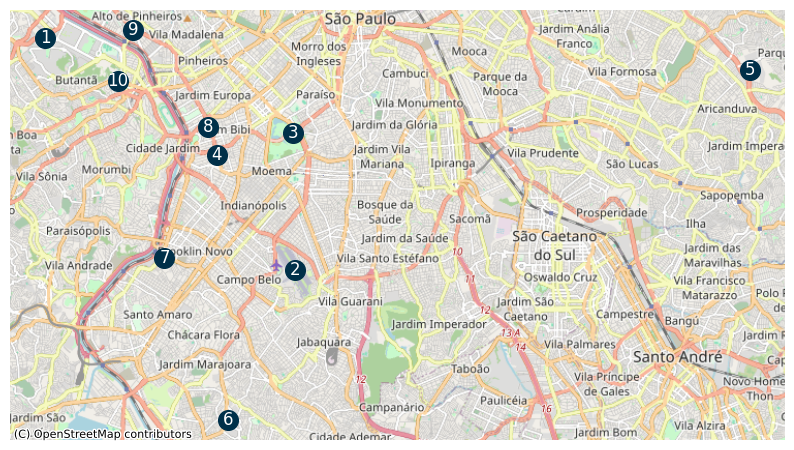

In [132]:
# Assuming 'top10_iptu_final' is already defined and is a GeoDataFrame
df = top10_iptu_final.copy()

# Configure CRS to match the plotting CRS
df = df.set_crs(epsg=3857)

# Plotting
fig, ax = plt.subplots(figsize=(10, 10))
df.plot(ax=ax, alpha=1, color = '#003049', markersize = 200)  # Adjust color and marker size as needed

# Add points with labels
for idx, row in df.iterrows():
    name = row['rank']  # Assuming 'rank' is a column in your DataFrame
    point = row.geometry
    plt.text(point.x, point.y, name, fontsize=12, ha='center', va='center', color = 'white')

# Add OpenStreetMap basemap
cx.add_basemap(ax, source=cx.providers.OpenStreetMap.Mapnik) # Using OSM Mapnik

ax.set_axis_off()  # Hide axes
plt.savefig('top10_imoveis.png', dpi=300, bbox_inches='tight')  # Save the plot
plt.show()
